
📌 RGB Image Metadata:
  - Shape: (3, 600, 597) (Bands, Height, Width)
  - Data Type: uint8
  - Min/Max Pixel Values: 0 / 255

📌 DSM Image Metadata:
  - Shape: (1, 600, 596) (Bands, Height, Width)
  - Data Type: float32
  - Min/Max Pixel Values: 1.96893310546875 / 14.47027587890625


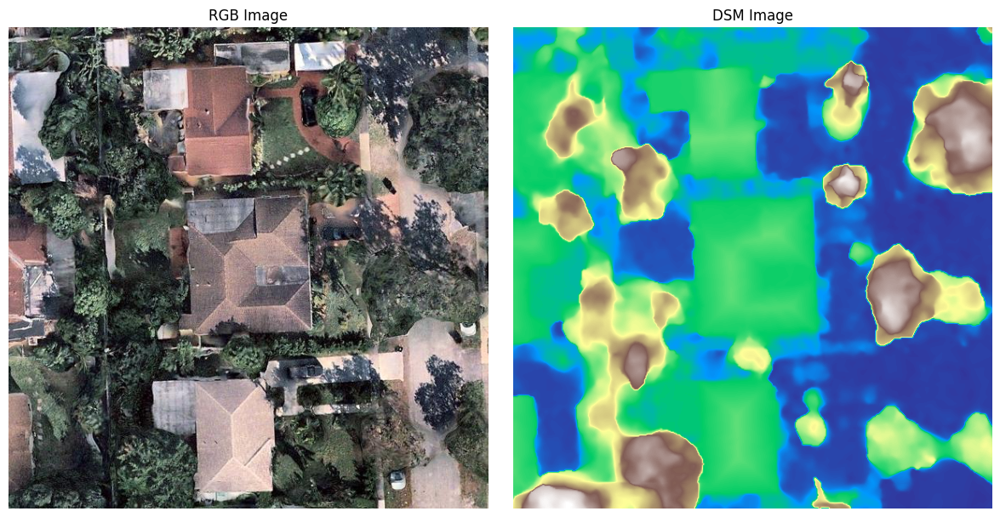

In [60]:
import rasterio
import numpy as np
import matplotlib.pyplot as plt

# Load and inspect RGB and DSM
def load_tiff(file_path):
    with rasterio.open(file_path) as dataset:
        image = dataset.read()  # Read all bands
        profile = dataset.profile  # Get metadata
    return image, profile

# Display metadata and pixel stats
def inspect_tiff(image, profile, title):
    print(f"\n📌 {title} Metadata:")
    print(f"  - Shape: {image.shape} (Bands, Height, Width)")
    print(f"  - Data Type: {profile['dtype']}")
    print(f"  - Min/Max Pixel Values: {image.min()} / {image.max()}")

# Visualize the images
def visualize_images(rgb, dsm):
    fig, axes = plt.subplots(1, 2, figsize=(12, 6))

    # Display RGB (First 3 channels)
    rgb_img = np.moveaxis(rgb[:3], 0, -1)  # Convert (Bands, H, W) → (H, W, Bands)
    axes[0].imshow(rgb_img)
    axes[0].set_title("RGB Image")
    axes[0].axis("off")

    # Display DSM (First band, grayscale)
    axes[1].imshow(dsm[0], cmap="terrain")  # DSM is single-channel
    axes[1].set_title("DSM Image")
    axes[1].axis("off")

    plt.tight_layout()
    plt.show()

# Provide your file paths
dsm_path= r"25.9231767_-80.18102429999999_nearmap_dsm.tif"
rgb_path = r"25.9231767_-80.18102429999999_nearmap_rgb.tif"

# Load Images
rgb_image, rgb_profile = load_tiff(rgb_path)
dsm_image, dsm_profile = load_tiff(dsm_path)

# Inspect Images
inspect_tiff(rgb_image, rgb_profile, "RGB Image")
inspect_tiff(dsm_image, dsm_profile, "DSM Image")

# Visualize
visualize_images(rgb_image, dsm_image)


In [61]:
print(type(rgb_image[0][0][0]))
print(type(dsm_image[0][0][0]))

<class 'numpy.uint8'>
<class 'numpy.float32'>


In [62]:
def normalize_dsm(dsm):
    """Normalize DSM from float32 to uint8 (0-255)"""
    dsm_min, dsm_max = dsm.min(), dsm.max()
    dsm_normalized = (255 * (dsm - dsm_min) / (dsm_max - dsm_min)).astype(np.uint8)
    return dsm_normalized

def fuse_images(rgb, dsm):
    """Stack RGB (3 channels) and DSM (1 channel) into a 4D tensor"""
    dsm_norm = normalize_dsm(dsm[0])  # Normalize first DSM band
    dsm_padded = pad_dsm(dsm_norm[np.newaxis, :, :], rgb.shape[2])
    fused = np.concatenate([rgb, dsm_padded], axis=0)  # Stack along channel axis
    return fused

def pad_dsm(dsm, target_width):
    """Pad DSM with an extra column to match RGB width"""
    _, height, width = dsm.shape
    if width < target_width:
        pad_width = target_width - width
        dsm = np.pad(dsm, ((0, 0), (0, 0), (0, pad_width)), mode="edge")  # Pad last column
    return dsm

In [63]:
print(rgb_image.shape[2])
fused_image = fuse_images(rgb_image, dsm_image)

597


In [64]:
def visualize_fusion(fused):
    """Visualize RGB and Fused Image"""
    fig, axes = plt.subplots(1, 2, figsize=(12, 6))

    # Display RGB
    rgb_img = np.moveaxis(fused[:3], 0, -1)
    axes[0].imshow(rgb_img)
    axes[0].set_title("RGB Image")
    axes[0].axis("off")

    # Display Fused Image (RGB + DSM)
    fused_img = np.moveaxis(fused, 0, -1)
    axes[1].imshow(fused_img[:, :, :3])  # Show RGB
    axes[1].imshow(fused_img[:, :, 3], cmap="jet", alpha=0.4)  # Overlay DSM
    axes[1].set_title("Fused RGB + DSM")
    axes[1].axis("off")

    plt.tight_layout()
    plt.show()

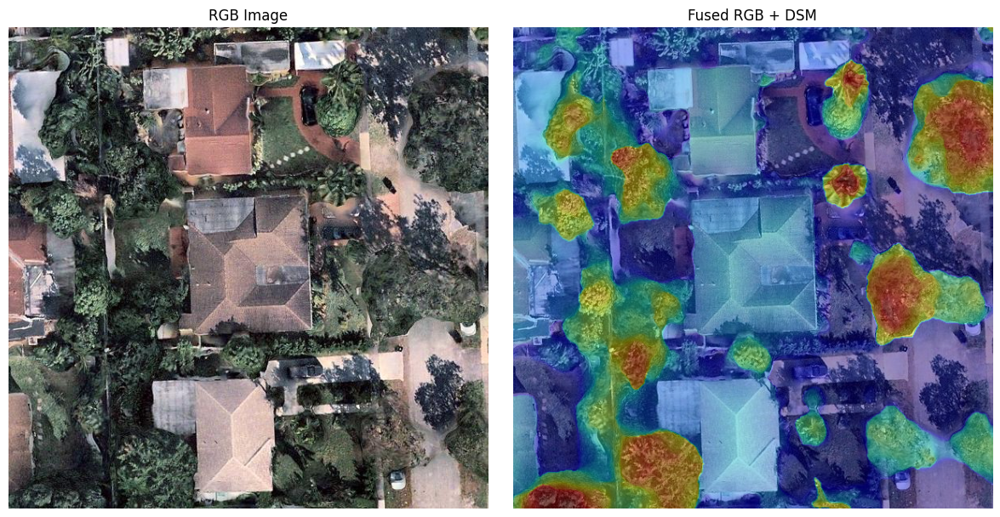

In [65]:
visualize_fusion(fused_image)

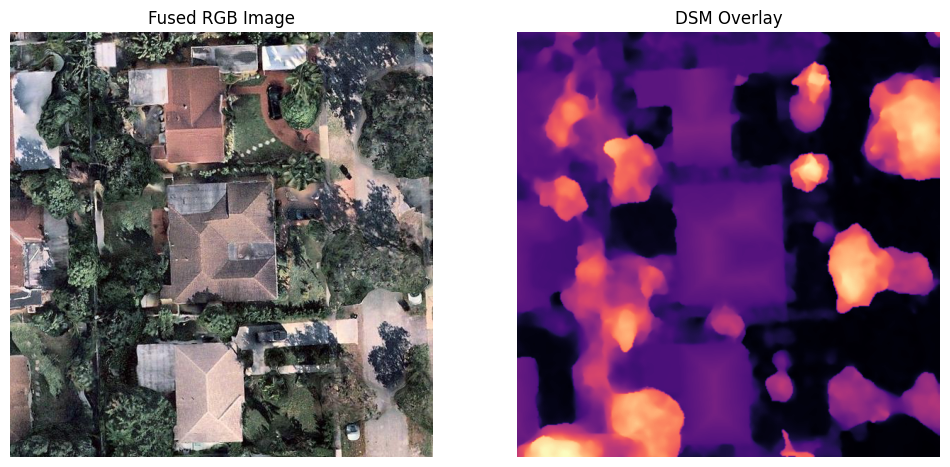

In [66]:
def visualize_fused_image(fused_image):
    """
    Visualizes the fused RGB + DSM image.
    Assumes shape: (4, H, W) -> First 3 channels = RGB, 4th channel = DSM.
    """
    if fused_image.shape[0] != 4:
        raise ValueError("Fused image must have 4 channels (RGB + DSM).")

    # Extract RGB and DSM channels
    rgb = np.transpose(fused_image[:3], (1, 2, 0))  # Convert (3, H, W) → (H, W, 3)
    dsm = fused_image[3]  # DSM remains (H, W)

    # Normalize DSM for visualization
    dsm_normalized = (dsm - dsm.min()) / (dsm.max() - dsm.min())

    # Plot
    fig, ax = plt.subplots(1, 2, figsize=(12, 6))

    ax[0].imshow(rgb)  # Display RGB image
    ax[0].set_title("Fused RGB Image")
    ax[0].axis("off")

    ax[1].imshow(dsm_normalized, cmap="magma")  # Display DSM with colormap
    ax[1].set_title("DSM Overlay")
    ax[1].axis("off")

    plt.show()

visualize_fused_image(fused_image)

In [67]:
from rasterio.transform import from_origin

def save_fused_image_rasterio(fused_image, output_path):
    # Ensure the shape is (Channels, Height, Width)
    if fused_image.shape[0] > fused_image.shape[-1]:  
        fused_image = fused_image.transpose(1, 2, 0)

    # Define metadata
    transform = from_origin(0, 0, 1, 1)  # Modify based on actual georeferencing
    metadata = {
        'driver': 'GTiff',
        'height': fused_image.shape[0],
        'width': fused_image.shape[1],
        'count': fused_image.shape[2],
        'dtype': fused_image.dtype,
        'crs': "EPSG:4326",  # Change CRS if applicable
        'transform': transform
    }

    # Save the image
    with rasterio.open(output_path, 'w', **metadata) as dst:
        for i in range(fused_image.shape[2]):  # Save each channel separately
            dst.write(fused_image[:, :, i], i + 1)

# Example usage
save_fused_image_rasterio(fused_image, "fused_output.tif")

c:\Users\adity\miniconda3\envs\pytorch-gpu-env\lib\site-packages\rasterio\__init__.py:343: NotGeoreferencedWarning: The given matrix is equal to Affine.identity or its flipped counterpart. GDAL may ignore this matrix and save no geotransform without raising an error. This behavior is somewhat driver-specific.
  dataset = writer(


R and D on dsms

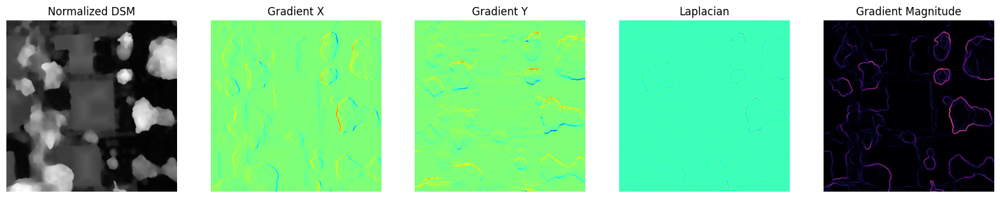

In [68]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def plot_dsm_gradients(dsm_array):
    """Compute and visualize gradients of an already loaded DSM."""

    # Ensure DSM is 2D (remove extra dimension if present)
    if len(dsm_array.shape) == 3:
        dsm_array = dsm_array[0]  # Take the first channel if shape is (1, H, W)

    # Convert DSM to float64 for OpenCV compatibility
    dsm = dsm_array.astype(np.float64)

    # Normalize DSM to 0-1
    dsm = (dsm - np.min(dsm)) / (np.max(dsm) - np.min(dsm) + 1e-6)

    # Compute Gradients
    grad_x = cv2.Sobel(dsm, cv2.CV_64F, 1, 0, ksize=3)  # X gradient
    grad_y = cv2.Sobel(dsm, cv2.CV_64F, 0, 1, ksize=3)  # Y gradient
    laplacian = cv2.Laplacian(dsm, cv2.CV_64F)  # Laplacian (second-order changes)
    magnitude = np.sqrt(grad_x**2 + grad_y**2)  # Gradient magnitude

    # Normalize for visualization (convert to 8-bit range)
    grad_x = cv2.normalize(grad_x, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)
    grad_y = cv2.normalize(grad_y, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)
    laplacian = cv2.normalize(laplacian, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)
    magnitude = cv2.normalize(magnitude, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)

    # Plot
    fig, axes = plt.subplots(1, 5, figsize=(20, 5))
    axes[0].imshow(dsm, cmap='gray')
    axes[0].set_title("Normalized DSM")

    axes[1].imshow(grad_x, cmap='jet')
    axes[1].set_title("Gradient X")

    axes[2].imshow(grad_y, cmap='jet')
    axes[2].set_title("Gradient Y")

    axes[3].imshow(laplacian, cmap='jet')
    axes[3].set_title("Laplacian")

    axes[4].imshow(magnitude, cmap='inferno')
    axes[4].set_title("Gradient Magnitude")

    for ax in axes:
        ax.axis("off")

    plt.show()

# === Example Usage ===
plot_dsm_gradients(dsm_array=dsm_image)  # Use your loaded DSM array here


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


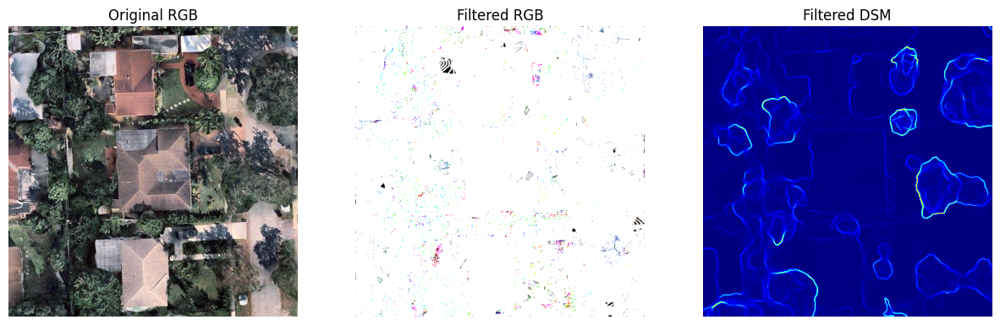

In [69]:
def apply_gradient_filter(rgb_image, dsm_array):
    """Apply the gradient magnitude as a filter to both RGB & DSM."""
    dsm_array=dsm_array[0]
    # Compute gradient magnitude from DSM
    dsm = dsm_array.astype(np.float64)

    # Normalize DSM to 0-1
    dsm = (dsm - np.min(dsm)) / (np.max(dsm) - np.min(dsm) + 1e-6)
    dsm_resized = cv2.resize(dsm_array, (rgb_image.shape[2],rgb_image.shape[1]), interpolation=cv2.INTER_CUBIC)

    # Compute Gradients
    grad_x = cv2.Sobel(dsm_resized, cv2.CV_64F, 1, 0, ksize=3)  # X gradient
    grad_y = cv2.Sobel(dsm_resized, cv2.CV_64F, 0, 1, ksize=3)  # Y gradient
    #laplacian = cv2.Laplacian(dsm_resized, cv2.CV_64F)  # Laplacian (second-order changes)
    grad_magnitude = np.sqrt(grad_x**2 + grad_y**2)  # Gradient magnitude

    # Apply filter to RGB
    filtered_rgb = rgb_image * grad_magnitude  # Broadcasting (3, H, W) * (H, W)
    
    # Apply filter to DSM
    filtered_dsm = dsm_resized * grad_magnitude  # (1, H, W) * (H, W)

    return filtered_rgb, filtered_dsm

# === Example Usage ===
filtered_rgb, filtered_dsm = apply_gradient_filter(rgb_image,dsm_image)

# Plot Results
fig, axes = plt.subplots(1, 3, figsize=(15, 5))
axes[0].imshow(rgb_image.transpose(1, 2, 0))  # Original RGB
axes[0].set_title("Original RGB")
axes[1].imshow(filtered_rgb.transpose(1, 2, 0))  # Filtered RGB
axes[1].set_title("Filtered RGB")
axes[2].imshow(filtered_dsm, cmap="jet")  # Filtered DSM
axes[2].set_title("Filtered DSM")

for ax in axes:
    ax.axis("off")

plt.show()

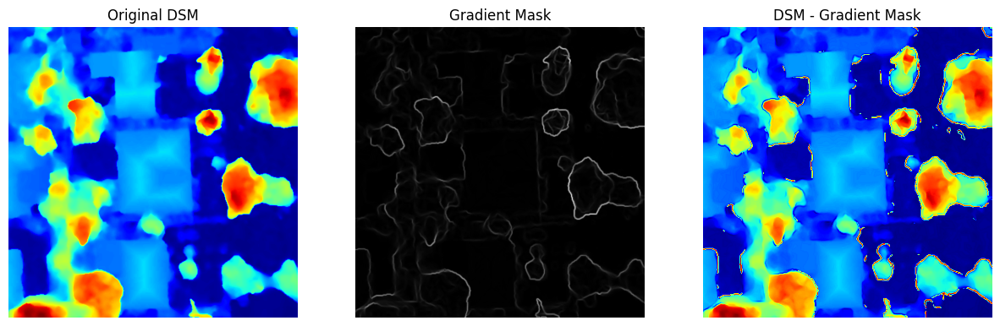

In [70]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# --- Normalize DSM ---
dsm_8bit = cv2.normalize(dsm_image.squeeze(), None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)

# --- Compute Gradient Magnitude ---
grad_x = cv2.Sobel(dsm_8bit, cv2.CV_64F, 1, 0, ksize=3)
grad_y = cv2.Sobel(dsm_8bit, cv2.CV_64F, 0, 1, ksize=3)
gradient_mask = np.sqrt(grad_x**2 + grad_y**2)
gradient_mask = cv2.normalize(gradient_mask, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)

# --- Subtract Gradient Mask from DSM ---
dsm_minus_mask = np.clip(dsm_8bit - gradient_mask, 0, 255).astype(np.uint8)

# --- Plot Results ---
fig, ax = plt.subplots(1, 3, figsize=(15, 5))

ax[0].imshow(dsm_8bit, cmap="jet")
ax[0].set_title("Original DSM")

ax[1].imshow(gradient_mask, cmap="gray")
ax[1].set_title("Gradient Mask")

ax[2].imshow(dsm_minus_mask, cmap="jet")
ax[2].set_title("DSM - Gradient Mask")

for a in ax:
    a.axis("off")

plt.show()


In [71]:
dsm_image.shape

(1, 600, 596)

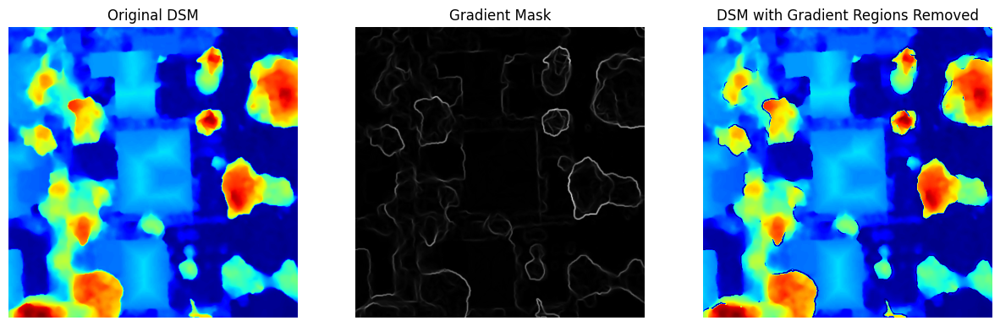

In [72]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# --- Ensure DSM is 2D ---
dsm_array = dsm_image.squeeze()  # (1, 600, 596) → (600, 596)

# --- Normalize DSM to 8-bit (0-255) ---
dsm_8bit = cv2.normalize(dsm_array, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)

# --- Compute Gradient Magnitude ---
grad_x = cv2.Sobel(dsm_8bit, cv2.CV_64F, 1, 0, ksize=3)
grad_y = cv2.Sobel(dsm_8bit, cv2.CV_64F, 0, 1, ksize=3)
gradient_mask = np.sqrt(grad_x**2 + grad_y**2)

# --- Normalize Gradient Mask to 8-bit ---
gradient_mask = cv2.normalize(gradient_mask, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)

# --- Threshold the Gradient Mask (Highlight Strong Edges) ---
_, binary_mask = cv2.threshold(gradient_mask, 50, 255, cv2.THRESH_BINARY)  # Adjust threshold as needed

# --- Remove Highlighted Pixels (Set to 0) ---
dsm_filtered = dsm_8bit.copy()
dsm_filtered[binary_mask > 0] = 0  # Set gradient-highlighted pixels to 0

# --- Plot Results ---
fig, ax = plt.subplots(1, 3, figsize=(15, 5))

ax[0].imshow(dsm_8bit, cmap="jet")
ax[0].set_title("Original DSM")

ax[1].imshow(gradient_mask, cmap="gray")
ax[1].set_title("Gradient Mask")

ax[2].imshow(dsm_filtered, cmap="jet")
ax[2].set_title("DSM with Gradient Regions Removed")

for a in ax:
    a.axis("off")

plt.show()


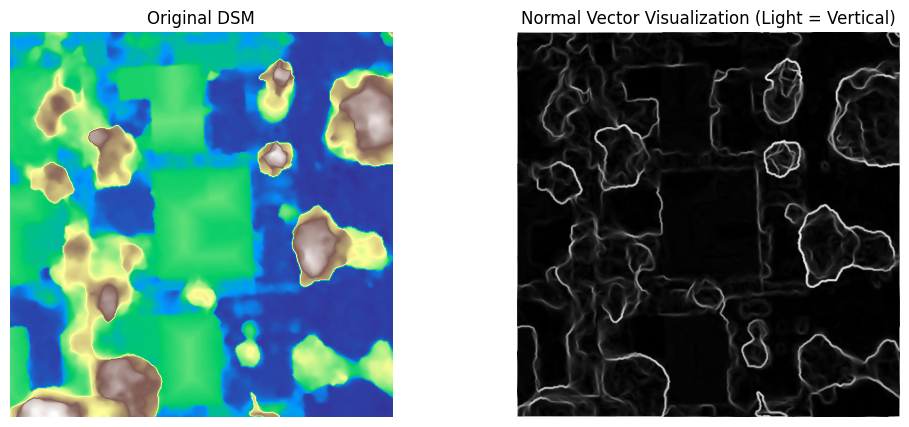

In [73]:
import numpy as np
import rasterio
import matplotlib.pyplot as plt

def compute_normals(dsm):
    """
    Computes normal vectors for a DSM using finite difference gradients.
    
    Parameters:
        dsm (numpy.ndarray): The DSM height values.
        
    Returns:
        normals (numpy.ndarray): The magnitude of normal vectors.
    """
    # Compute partial derivatives using central difference
    dz_dx = (np.roll(dsm, -1, axis=1) - np.roll(dsm, 1, axis=1)) / 2
    dz_dy = (np.roll(dsm, -1, axis=0) - np.roll(dsm, 1, axis=0)) / 2

    # Normal vectors
    normals = np.dstack((-dz_dx, -dz_dy, np.ones_like(dsm)))

    # Normalize to get unit normals
    magnitude = np.linalg.norm(normals, axis=2)
    normals /= magnitude[:, :, np.newaxis]

    return normals

def visualize_normals(dsm_path):
    """
    Loads a DSM file, computes normal vectors, and visualizes them.
    
    Parameters:
        dsm_path (str): Path to the DSM GeoTIFF file.
    """
    # Load DSM
    with rasterio.open(dsm_path) as dataset:
        dsm = dataset.read(1).astype(np.float32)  # Read as float32
    
    # Compute normals
    normals = compute_normals(dsm)
    
    # Compute inclination angle (arccos of the Z component)
    vertical_component = normals[:, :, 2]  # The Z component
    inclination_angle = np.arccos(np.clip(vertical_component, -1, 1))  # Angle from vertical

    # Normalize for visualization (light = vertical, dark = horizontal)
    normal_map = (inclination_angle - inclination_angle.min()) / (inclination_angle.max() - inclination_angle.min())

    # Plot results
    fig, ax = plt.subplots(1, 2, figsize=(12, 5))

    ax[0].imshow(dsm, cmap='terrain', vmin=dsm.min(), vmax=dsm.max())
    ax[0].set_title("Original DSM")
    ax[0].axis("off")

    ax[1].imshow(normal_map, cmap='gray')
    ax[1].set_title("Normal Vector Visualization (Light = Vertical)")
    ax[1].axis("off")

    plt.show()

# Example Usage:
dsm_path = "25.9231767_-80.18102429999999_nearmap_dsm.tif"  # Replace with your actual DSM file path
visualize_normals(dsm_path)


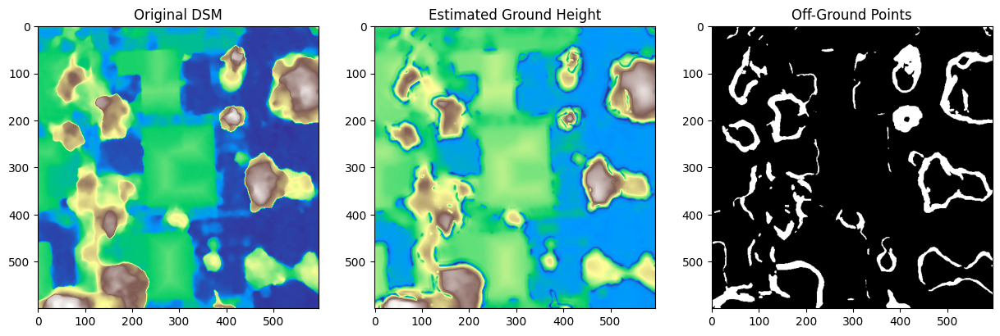

In [74]:
import numpy as np
import rasterio
import matplotlib.pyplot as plt
from scipy.ndimage import uniform_filter
import cv2

def compute_normals(dsm):
    """ Compute normal vectors and return Z-component (flat area indicator) """
    dz_dx = np.gradient(dsm, axis=1)
    dz_dy = np.gradient(dsm, axis=0)
    
    normals = np.stack((-dz_dx, -dz_dy, np.ones_like(dsm)), axis=-1)
    normals /= np.linalg.norm(normals, axis=-1, keepdims=True)
    
    return normals[:, :, 2]  # Z-component (verticality indicator)

def estimate_ground(dsm, z_component, patch_sizes=[5, 10, 20]):
    """ Estimate ground height using iterative grid filtering on vertical areas """
    flat_mask = z_component > 0.95  # Select areas with near-vertical normals
    ground_heights = np.full_like(dsm, np.inf)
    
    for patch in patch_sizes:
        min_filtered = uniform_filter(dsm * flat_mask, size=patch, mode='nearest')
        ground_heights = np.minimum(ground_heights, min_filtered)
    
    ground_heights[ground_heights == np.inf] = np.nanmin(ground_heights)  # Replace inf
    return ground_heights

def extract_off_ground(dsm, ground_heights, threshold=2):
    """ Extract off-ground points based on threshold above ground height """
    return dsm > (ground_heights + threshold)

def remove_vegetation(off_ground_mask, min_area=150):
    """ Remove small irregular shapes (vegetation) using morphological filtering """
    # Convert boolean mask to uint8 for OpenCV processing
    mask = off_ground_mask.astype(np.uint8) * 255
    
    # Find connected components
    num_labels, labels, stats, _ = cv2.connectedComponentsWithStats(mask, connectivity=8)
    
    # Remove small areas (likely vegetation)
    filtered_mask = np.zeros_like(mask)
    for i in range(1, num_labels):  # Ignore background (label 0)
        if stats[i, cv2.CC_STAT_AREA] > min_area:
            filtered_mask[labels == i] = 255

    return filtered_mask.astype(bool)

from scipy.ndimage import binary_erosion, binary_dilation

def filter_noise_blunders(dsm, cleaned_off_ground, normal_vectors, height_thresh=0.5, iter_erode=1, iter_dilate=2):
    """ 
    Step 1: Identify noise based on height variation & normal vector change
    Step 2: Remove noise with erosion
    Step 3: Restore stable roof points with dilation
    """
    # Ensure DSM is 2D (remove extra dimension if present)
    #dsm = np.squeeze(dsm)  # Ensures shape is (600, 596)

    # Compute height differences
    dz_dx = np.gradient(dsm, axis=1)  # Gradient along width
    dz_dy = np.gradient(dsm, axis=0)  # Gradient along height
    height_variation = np.hypot(dz_dx, dz_dy)  # Gradient magnitude

    # Ensure normal_vectors is 3D with shape (600, 596, 2)
    if normal_vectors.ndim == 2:
        raise ValueError(f"Expected normal_vectors to be 3D (600,596,2), but got shape {normal_vectors.shape}")
    
    # Compute normal variation
    normal_variation = np.hypot(
        np.gradient(normal_vectors[..., 0], axis=0) + np.gradient(normal_vectors[..., 1], axis=1)
    )
    # Detect noisy points near building outlines
    noise_mask = (height_variation > height_thresh) | (normal_variation > 0.2)
    noise_mask = noise_mask & cleaned_off_ground  # Apply only to off-ground areas

    # Erode noise points
    eroded_mask = binary_erosion(cleaned_off_ground, iterations=iter_erode) & ~noise_mask

    # Seed points (stable roof regions)
    stable_points = binary_dilation(eroded_mask, iterations=1) & cleaned_off_ground

    # Restore over-eroded areas
    restored_mask = binary_dilation(stable_points, iterations=iter_dilate)

    return restored_mask


# Load DSM
dsm_path = "25.9231767_-80.18102429999999_nearmap_dsm.tif"
with rasterio.open(dsm_path) as src:
    dsm = src.read(1).astype(np.float32)

# Process DSM
z_component = compute_normals(dsm)
ground_heights = estimate_ground(dsm, z_component)
off_ground_mask = extract_off_ground(dsm, ground_heights)
#cleaned_off_ground = remove_vegetation(off_ground_mask)
#final_roof_mask = filter_noise_blunders(dsm, cleaned_off_ground, z_component)

# Visualization
fig, ax = plt.subplots(1, 3, figsize=(15, 5))
ax[0].imshow(dsm, cmap="terrain")
ax[0].set_title("Original DSM")
ax[1].imshow(ground_heights, cmap="terrain")
ax[1].set_title("Estimated Ground Height")
ax[2].imshow(off_ground_mask, cmap="gray")
ax[2].set_title("Off-Ground Points")
plt.show()





In [75]:
def detect_eaves(dsm, off_ground_mask, min_height_diff=2.0, min_region_size=50):
    """
    Detects eaves by finding height discontinuities along the roof boundary.
    
    Parameters:
    - dsm: 2D numpy array, the DSM data.
    - off_ground_mask: 2D boolean array, True for off-ground points (buildings).
    - min_height_diff: Minimum height difference to consider an edge as an eave.
    - min_region_size: Minimum number of pixels to consider a valid roof sub-footprint.

    Returns:
    - eave_mask: 2D boolean array with eave pixels marked as True.
    - sub_footprints: List of roof partitions (contours).
    """

    # Compute height gradient (edge detection on height differences)
    grad_x = np.abs(np.diff(dsm, axis=1))  # Height changes along x-axis
    grad_y = np.abs(np.diff(dsm, axis=0))  # Height changes along y-axis

    # Identify significant height changes (eaves candidates)
    edges_x = (grad_x > min_height_diff)
    edges_y = (grad_y > min_height_diff)

    # Pad to restore original shape
    edges_x = np.pad(edges_x, ((0, 0), (0, 1)), mode='constant')
    edges_y = np.pad(edges_y, ((0, 1), (0, 0)), mode='constant')

    # Combine both axes to get potential eave locations
    eave_mask = np.logical_or(edges_x, edges_y)

    # Keep only eaves that belong to off-ground (buildings)
    eave_mask = np.logical_and(eave_mask, off_ground_mask)

    # Find contours of detected roof boundaries
    contours, _ = cv2.findContours(eave_mask.astype(np.uint8), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Filter out small regions (potential noise)
    sub_footprints = [cnt for cnt in contours if cv2.contourArea(cnt) > min_region_size]

    # Smoothing step: Reduce boundary points
    smoothed_sub_footprints = [cv2.approxPolyDP(cnt, epsilon=3, closed=True) for cnt in sub_footprints]

    return eave_mask, smoothed_sub_footprints




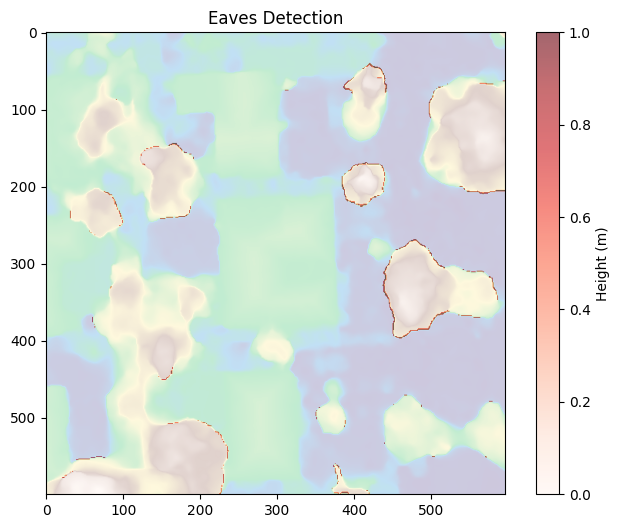

In [76]:
eave_mask, sub_footprints = detect_eaves(dsm, off_ground_mask)

# Visualizing the detected eaves


plt.figure(figsize=(8, 6))
plt.imshow(dsm, cmap='terrain', alpha=0.6)
plt.imshow(eave_mask, cmap='Reds', alpha=0.6)  # Eaves in red
plt.title("Eaves Detection")
plt.colorbar(label="Height (m)")
plt.show()

In [77]:
import scipy.ndimage as ndi
from skimage.measure import label, regionprops

def detect_roof_faces(dsm, eave_mask, normal_vectors, gradient_threshold=0.1, min_region_size=100):
    """
    Segments the roof into faces based on region growing and defines intersections.
    
    Parameters:
    - dsm: 2D numpy array, the DSM data.
    - eave_mask: 2D boolean array, True for eave pixels.
    - normal_vectors: 3D array (H, W, 3), containing normal vectors.
    - gradient_threshold: Minimum gradient required to separate roof faces.
    - min_region_size: Minimum size to consider a valid roof face.
    
    Returns:
    - roof_face_labels: 2D array, each roof face is assigned a unique ID.
    - face_boundaries: List of roof face boundaries.
    """

    # Compute height gradient
    grad_x = np.abs(np.diff(dsm, axis=1))
    grad_y = np.abs(np.diff(dsm, axis=0))

    # Threshold gradients to find steep changes (potential face separations)
    face_edges_x = grad_x > gradient_threshold
    face_edges_y = grad_y > gradient_threshold

    # Pad to restore shape
    face_edges_x = np.pad(face_edges_x, ((0, 0), (0, 1)), mode='constant')
    face_edges_y = np.pad(face_edges_y, ((0, 1), (0, 0)), mode='constant')

    # Combine edge detections
    face_edges = np.logical_or(face_edges_x, face_edges_y)

    # Apply region-growing segmentation
    seed_mask = np.logical_and(~eave_mask, ~face_edges)  # Start from non-eave, non-edge areas
    roof_face_labels, num_faces = label(seed_mask, connectivity=2, return_num=True)

    # Remove small noise regions
    for region in regionprops(roof_face_labels):
        if region.area < min_region_size:
            roof_face_labels[roof_face_labels == region.label] = 0  # Remove small regions

    # Extract face boundaries
    face_boundaries = []
    for region in regionprops(roof_face_labels):
        face_boundaries.append(region.coords)  # Store boundary coordinates

    return roof_face_labels, face_boundaries


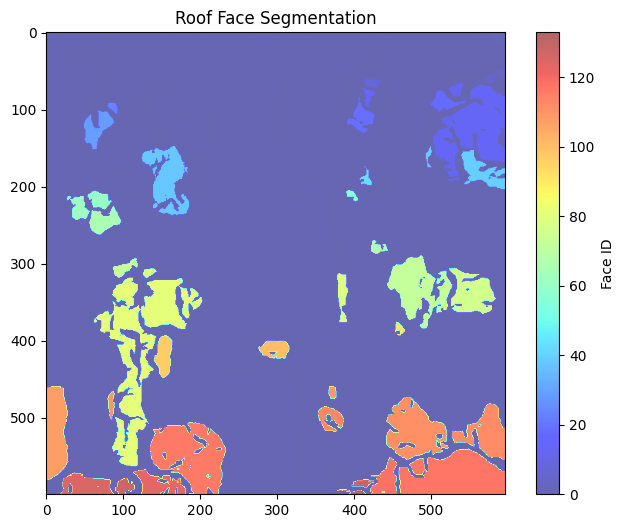

In [78]:
roof_faces, face_boundaries = detect_roof_faces(dsm, eave_mask, z_component)

# Visualizing the roof segmentation
plt.figure(figsize=(8, 6))
plt.imshow(roof_faces, cmap='jet', alpha=0.6)  # Each face gets a different color
plt.title("Roof Face Segmentation")
plt.colorbar(label="Face ID")
plt.show()

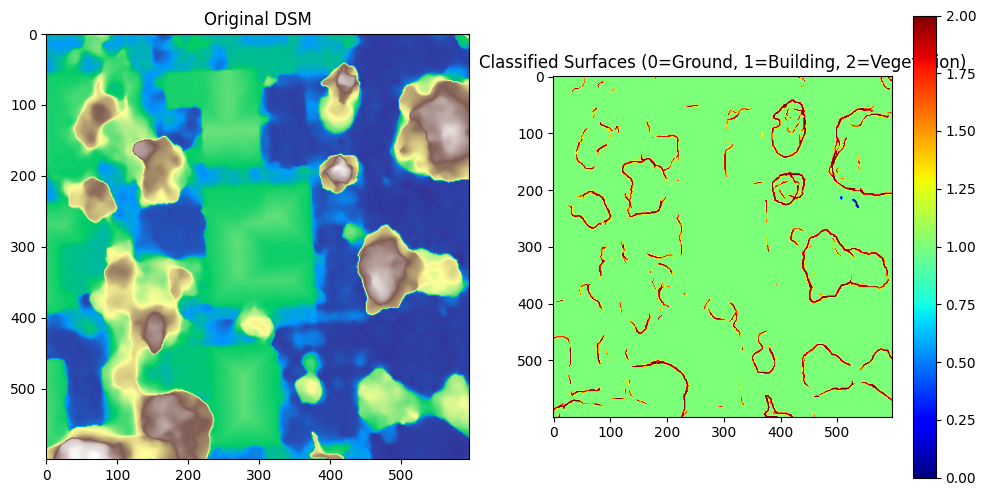

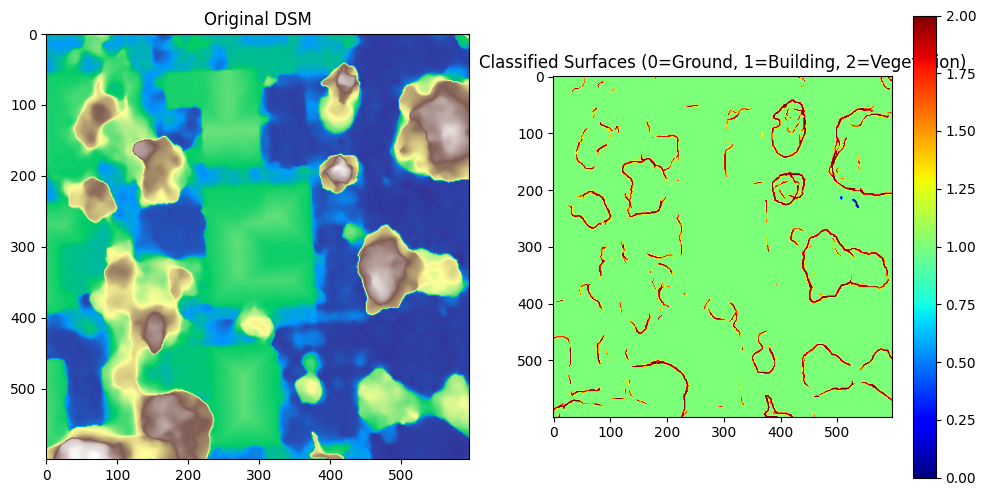

In [79]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter

import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter

def classify_surfaces(dsm, ground_threshold=2.0, vegetation_gradient_threshold=0.5, sigma=1e-2):
    """
    Classifies surfaces in a DSM image into ground, buildings, and vegetation.
    
    Parameters:
    - dsm: 2D numpy array (float32) representing the DSM height values.
    - ground_threshold: Height threshold (meters) to separate ground from structures.
    - vegetation_gradient_threshold: Gradient threshold to identify vegetation.
    - sigma: Standard deviation for Gaussian smoothing.

    Returns:
    - surface_map: 2D array with classified surfaces (0=Ground, 1=Buildings, 2=Vegetation).
    """
    
    # Apply Gaussian filtering to smooth the DSM
    dsm_smooth = gaussian_filter(dsm, sigma=sigma)

    # Compute gradient (height variations) on the smoothed DSM
    grad_x = np.abs(np.diff(dsm_smooth, axis=1, prepend=dsm_smooth[:, 0:1]))
    grad_y = np.abs(np.diff(dsm_smooth, axis=0, prepend=dsm_smooth[0:1, :]))
    
    gradient_magnitude = np.sqrt(grad_x**2 + grad_y**2)  # Compute gradient magnitude

    # Classify surfaces
    surface_map = np.zeros_like(dsm, dtype=np.uint8)  # 0 = Ground (default)

    # Identify buildings (height above ground threshold)
    surface_map[dsm_smooth > ground_threshold] = 1  # Buildings (1)

    # Identify vegetation (high gradient areas)
    surface_map[(gradient_magnitude > vegetation_gradient_threshold) & (dsm_smooth > ground_threshold)] = 2  # Vegetation (2)

    return surface_map, dsm_smooth

# Example Usage
#dsm = np.random.uniform(1.5, 15, (600, 596)).astype(np.float32)  # Simulated DSM
surface_map, dsm_smooth = classify_surfaces(dsm)

# Visualization
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

# Original DSM
axes[0].imshow(dsm, cmap='terrain')
axes[0].set_title("Original DSM")

# Smoothed DSM Classification
axes[1].imshow(surface_map, cmap='jet')
axes[1].set_title("Classified Surfaces (0=Ground, 1=Building, 2=Vegetation)")

plt.colorbar(axes[1].imshow(surface_map, cmap='jet'), ax=axes[1])
plt.show()


# Example Usage
#dsm = np.random.uniform(1.5, 15, (600, 596)).astype(np.float32)  # Simulated DSM
surface_map, dsm_smooth = classify_surfaces(dsm)

# Visualization
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

# Original DSM
axes[0].imshow(dsm, cmap='terrain')
axes[0].set_title("Original DSM")

# Smoothed DSM Classification
axes[1].imshow(surface_map, cmap='jet')
axes[1].set_title("Classified Surfaces (0=Ground, 1=Building, 2=Vegetation)")

plt.colorbar(axes[1].imshow(surface_map, cmap='jet'), ax=axes[1])
plt.show()



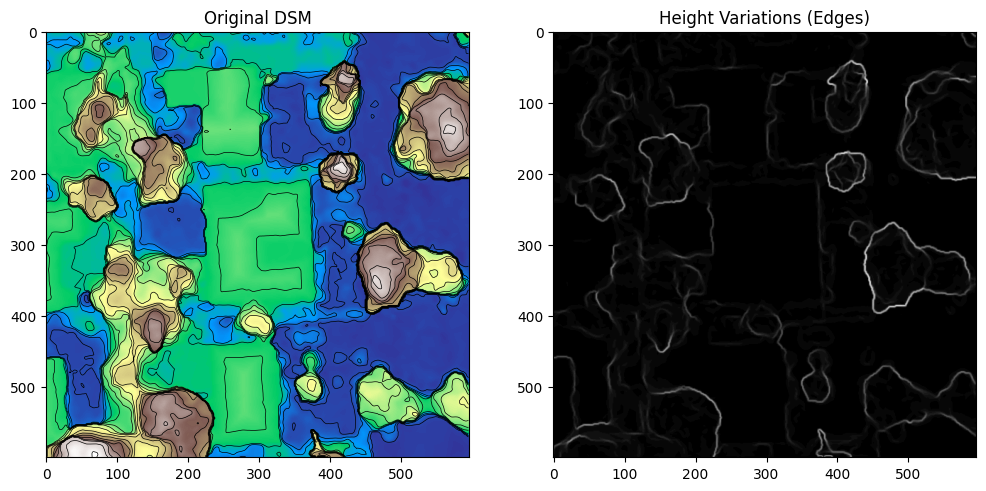

In [80]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

def draw_height_variation(dsm):
    """
    Draws lines to show height variations in a DSM using contours and gradient-based edges.

    Parameters:
    - dsm: 2D numpy array (float32) representing the DSM.
    """
    # Compute gradient (height variations)
    sobelx = cv2.Sobel(dsm, cv2.CV_64F, 1, 0, ksize=3)  # Horizontal gradient
    sobely = cv2.Sobel(dsm, cv2.CV_64F, 0, 1, ksize=3)  # Vertical gradient
    gradient_magnitude = np.sqrt(sobelx**2 + sobely**2)

    # Normalize for visualization
    gradient_magnitude = cv2.convertScaleAbs(gradient_magnitude)

    # Plot DSM with contours
    fig, ax = plt.subplots(1, 2, figsize=(12, 6))

    # Original DSM visualization
    ax[0].imshow(dsm, cmap="terrain")
    ax[0].set_title("Original DSM")
    ax[0].contour(dsm, levels=15, colors="black", linewidths=0.5)  # Contour lines

    # Gradient-based edge visualization
    ax[1].imshow(gradient_magnitude, cmap="gray")
    ax[1].set_title("Height Variations (Edges)")

    plt.show()

# Load DSM (Example)
#dsm = np.random.uniform(1.5, 15, (600, 596)).astype(np.float32)  # Simulated DSM

# Draw height variations
draw_height_variation(dsm)


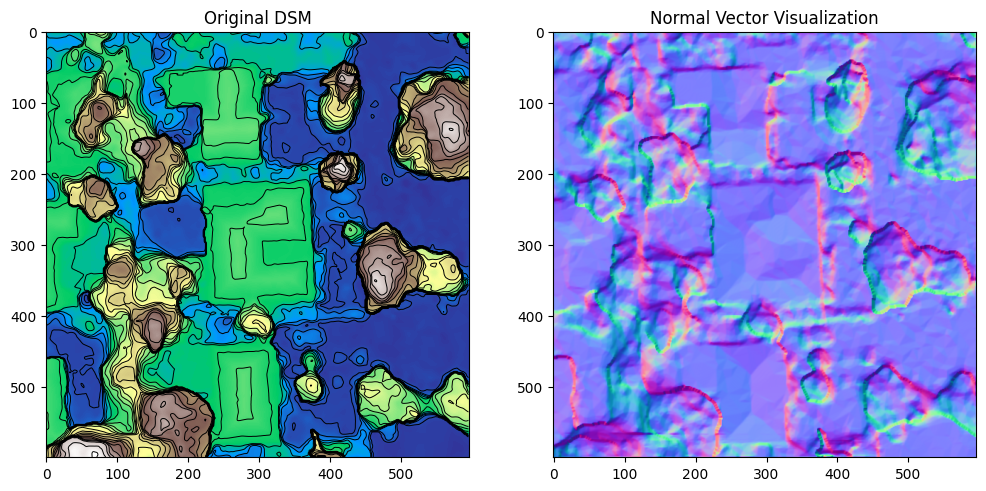

In [81]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

def compute_normals(dsm):
    """
    Computes normal vectors for a DSM to analyze surface variations.

    Parameters:
    - dsm: 2D numpy array (float32) representing the DSM.

    Returns:
    - normals: 3D numpy array (H, W, 3) where each pixel has an (Nx, Ny, Nz) normal.
    - normal_viz: RGB image visualization of normals.
    """
    # Compute gradients
    dx = cv2.Sobel(dsm, cv2.CV_64F, 1, 0, ksize=3)  # Gradient in X direction
    dy = cv2.Sobel(dsm, cv2.CV_64F, 0, 1, ksize=3)  # Gradient in Y direction

    # Assume Z gradient as constant (1) for normal estimation
    dz = np.ones_like(dsm)

    # Compute normal vectors (cross product of [dx, 0, dz] and [0, dy, dz])
    Nx = -dx
    Ny = -dy
    Nz = dz  # Constant Z direction

    # Normalize the normal vectors
    norm = np.sqrt(Nx**2 + Ny**2 + Nz**2)
    Nx /= norm
    Ny /= norm
    Nz /= norm

    # Create RGB visualization of normals
    normal_viz = np.stack([Nx, Ny, Nz], axis=-1)
    normal_viz = (normal_viz - normal_viz.min()) / (normal_viz.max() - normal_viz.min())  # Normalize to [0,1]
    
    return np.dstack([Nx, Ny, Nz]), normal_viz

def visualize_normals(dsm):
    """
    Computes and visualizes normal vectors of a DSM.
    """
    normals, normal_viz = compute_normals(dsm)

    # Plot DSM and Normal Map
    fig, ax = plt.subplots(1, 2, figsize=(12, 6))

    # Original DSM
    ax[0].imshow(dsm, cmap="terrain")
    ax[0].set_title("Original DSM")
    ax[0].contour(dsm, levels=20, colors="black", linewidths=0.7)

    # Normal Vector Visualization
    ax[1].imshow(normal_viz)
    ax[1].set_title("Normal Vector Visualization")

    plt.show()
    
# Example DSM (Simulated)
#dsm = np.random.uniform(1.5, 15, (600, 596)).astype(np.float32)  # Simulated DSM

# Compute and visualize normal vectors
visualize_normals(dsm)


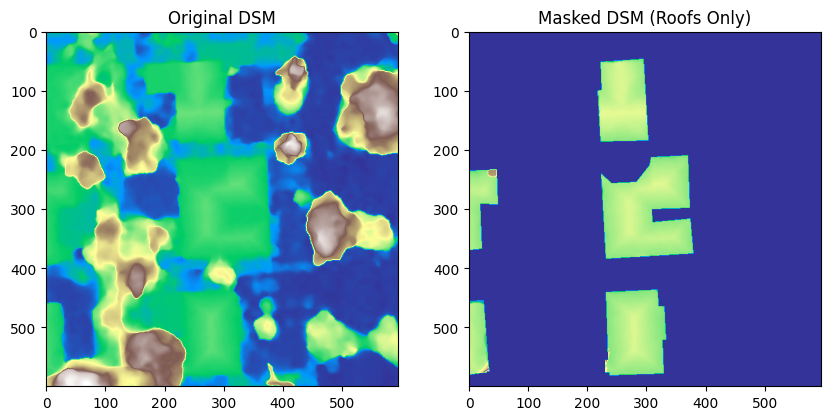

In [82]:
import numpy as np
import json
import cv2
import matplotlib.pyplot as plt
from PIL import Image, ImageDraw

def load_json_annotations(json_path, dsm_shape):
    """
    Load JSON annotation file and create a binary mask for roofs.

    Parameters:
    - json_path: Path to the annotation JSON file.
    - dsm_shape: Tuple (H, W) of the DSM.

    Returns:
    - mask: Binary numpy array (1 for roof pixels, 0 for others).
    """
    with open(json_path, 'r') as f:
        annotations = json.load(f)

    mask = np.zeros(dsm_shape, dtype=np.uint8)

    for obj in annotations['shapes']:
        if obj['label'] == 'roof':  # Only process roof annotations
            polygon = np.array(obj['points'], dtype=np.int32)  # Convert points to NumPy array
            cv2.fillPoly(mask, [polygon], 1)  # Fill polygon in mask

    return mask

def apply_roof_mask(dsm, mask):
    """
    Applies the roof mask to the DSM, setting non-roof areas to NaN.

    Parameters:
    - dsm: 2D numpy array of the DSM.
    - mask: Binary 2D mask (1 for roofs, 0 for others).

    Returns:
    - dsm_masked: DSM with non-roof areas set to NaN.
    """
    dsm_masked = np.where(mask, dsm, 0)  # Mask non-roof areas
    return dsm_masked

# Example Usage
json_path = "25.9231767_-80.18102429999999_nearmap_rgb.json"  # Replace with your actual path
#dsm = np.random.uniform(1.5, 15, (600, 600)).astype(np.float32)  # Simulated DSM
mask = load_json_annotations(json_path, dsm.shape)  # Generate mask from JSON
dsm_masked = apply_roof_mask(dsm, mask)  # Apply mask

# Visualization
plt.figure(figsize=(10,5))
plt.subplot(1,2,1)
plt.imshow(dsm, cmap='terrain')
plt.title("Original DSM")

plt.subplot(1,2,2)
plt.imshow(dsm_masked, cmap='terrain')
plt.title("Masked DSM (Roofs Only)")

plt.show()


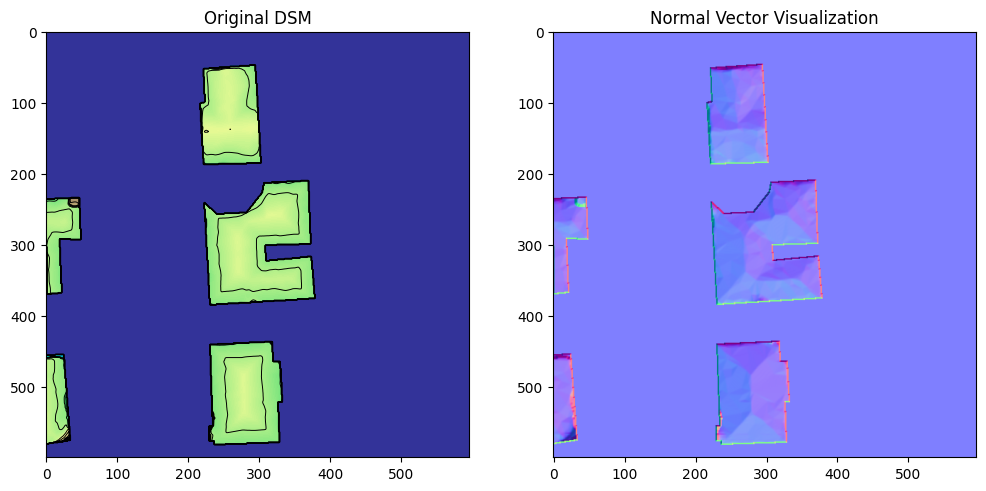

In [83]:
type(dsm_masked[0][0])

visualize_normals(dsm_masked)

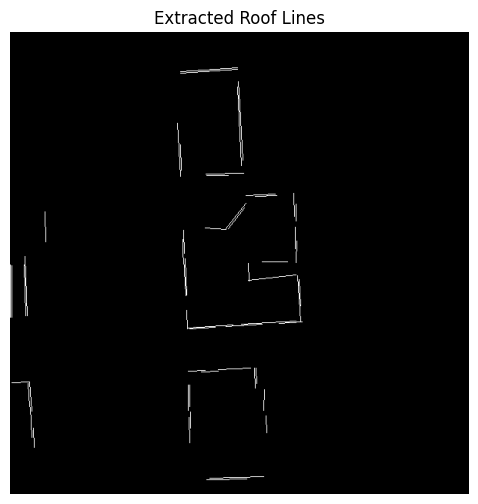

In [84]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def extract_roof_lines(dsm, threshold1=50, threshold2=150):
    """
    Extracts roof lines (edges, ridges, and boundaries) from a DSM using Sobel, Canny, and Hough Transform.
    
    Parameters:
        dsm (numpy array): The masked DSM (only roofs)
        threshold1 (int): Lower threshold for Canny edge detection
        threshold2 (int): Upper threshold for Canny edge detection
    Returns:
        line_img (numpy array): Image with detected roof lines drawn
    """

    # Compute Sobel gradients to enhance edges
    sobel_x = cv2.Sobel(dsm, cv2.CV_64F, 1, 0, ksize=3)
    sobel_y = cv2.Sobel(dsm, cv2.CV_64F, 0, 1, ksize=3)
    sobel_magnitude = np.sqrt(sobel_x**2 + sobel_y**2)
    sobel_magnitude = cv2.normalize(sobel_magnitude, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)

    # Apply Canny Edge Detection
    edges = cv2.Canny(sobel_magnitude, threshold1, threshold2)

    # Apply Hough Line Transform
    lines = cv2.HoughLinesP(edges, 1, np.pi/180, 30, minLineLength=20, maxLineGap=5)

    # Draw detected lines on a blank image
    line_img = np.zeros_like(dsm, dtype=np.uint8)
    if lines is not None:
        for line in lines:
            x1, y1, x2, y2 = line[0]
            cv2.line(line_img, (x1, y1), (x2, y2), 255, 1)

    return line_img

# Load your masked DSM (already filtered for roofs)
#dsm_masked = np.load("your_masked_dsm.npy")  # Load your DSM array
roof_lines = extract_roof_lines(dsm_masked)

# Display result
plt.figure(figsize=(8, 6))
plt.imshow(roof_lines, cmap='gray')
plt.title("Extracted Roof Lines")
plt.axis('off')
plt.show()


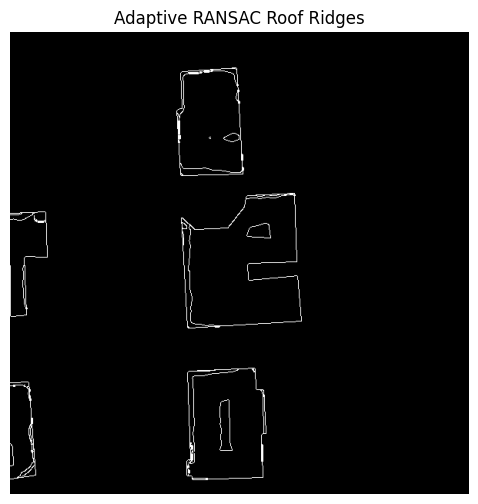

In [85]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from sklearn.linear_model import RANSACRegressor

def dsm_to_point_cloud(dsm):
    """ Convert DSM to 3D point cloud (x, y, height). """
    h, w = dsm.shape
    x, y = np.meshgrid(np.arange(w), np.arange(h))
    points = np.column_stack((x.ravel(), y.ravel(), dsm.ravel()))
    return points, h, w  # Return height and width for reshaping later

def fit_planes_ransac_dynamic(points, h, w, min_points=300, threshold=0.2):
    """ 
    Iteratively fit planes to the DSM using RANSAC until no significant inliers remain.
    - `min_points`: Minimum number of points required to fit a plane.
    - `threshold`: RANSAC inlier threshold (adjust to refine segmentation).
    """
    planes = []
    inlier_masks = []
    remaining_indices = np.arange(len(points))

    while len(remaining_indices) > min_points:
        # Fit a plane using RANSAC
        model = RANSACRegressor(residual_threshold=threshold)
        model.fit(points[remaining_indices, :2], points[remaining_indices, 2])  # Fit Z from (X, Y)

        # Get inliers
        inliers = model.inlier_mask_
        if np.sum(inliers) < min_points:  # Stop if too few inliers are found
            break

        # Store plane parameters
        planes.append(model.estimator_.coef_)

        # Create inlier mask
        inlier_mask = np.zeros((h * w), dtype=bool)
        inlier_mask[remaining_indices[inliers]] = True  # Mark detected plane

        inlier_masks.append(inlier_mask.reshape(h, w))

        # Remove inliers from remaining points
        remaining_indices = remaining_indices[~inliers]

    return planes, inlier_masks

def extract_ridges(inlier_masks):
    """ Extract ridges by detecting boundaries between different plane segments. """
    h, w = inlier_masks[0].shape
    ridge_map = np.zeros((h, w), dtype=np.uint8)

    for mask in inlier_masks:
        edges = cv2.Canny(mask.astype(np.uint8) * 255, 50, 150)
        ridge_map = np.maximum(ridge_map, edges)

    return ridge_map

# Load masked DSM
#dsm_masked = np.load("your_masked_dsm.npy")

# Convert to point cloud
points, h, w = dsm_to_point_cloud(dsm_masked)

# Adaptive RANSAC Plane Extraction
planes, inlier_masks = fit_planes_ransac_dynamic(points, h, w, min_points=300, threshold=0.5)

# Extract ridges
ridge_map = extract_ridges(inlier_masks)

# Visualize
plt.figure(figsize=(8, 6))
plt.imshow(ridge_map, cmap='gray')
plt.title("Adaptive RANSAC Roof Ridges")
plt.axis('off')
plt.show()


Ransac but with normal vector computations prior.

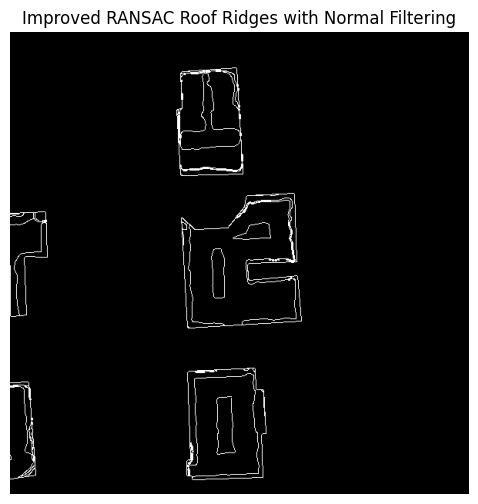

In [86]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from sklearn.linear_model import RANSACRegressor

def dsm_to_point_cloud(dsm):
    """ Convert DSM to 3D point cloud (x, y, height). """
    h, w = dsm.shape
    x, y = np.meshgrid(np.arange(w), np.arange(h))
    points = np.column_stack((x.ravel(), y.ravel(), dsm.ravel()))
    return points, h, w  # Return height & width

def compute_normals(points, inlier_indices):
    """ Compute normal vectors for extracted planes. """
    subset = points[inlier_indices]
    
    # Fit plane (Ax + By + Cz = D) using least squares
    A = np.column_stack((subset[:, 0], subset[:, 1], np.ones_like(subset[:, 2])))
    plane_coeffs, _, _, _ = np.linalg.lstsq(A, subset[:, 2], rcond=None)
    
    normal = np.array([plane_coeffs[0], plane_coeffs[1], -1])  # Normal vector
    normal /= np.linalg.norm(normal)  # Normalize
    
    return normal

def fit_planes_ransac_dynamic(points, h, w, min_points=300, threshold=0.3):
    """ Iteratively fit planes to the DSM using RANSAC. """
    planes = []
    inlier_masks = []
    remaining_indices = np.arange(len(points))

    while len(remaining_indices) > min_points:
        model = RANSACRegressor(residual_threshold=threshold)
        model.fit(points[remaining_indices, :2], points[remaining_indices, 2])

        inliers = model.inlier_mask_
        if np.sum(inliers) < min_points:
            break

        # Compute normal for plane
        normal = compute_normals(points, remaining_indices[inliers])
        
        # Filter out unwanted planes (e.g., horizontal ground)
        if abs(normal[2]) < 0.7:  # Ignore nearly flat surfaces
            remaining_indices = remaining_indices[~inliers]
            continue

        # Store plane coefficients & mask
        planes.append((model.estimator_.coef_, normal))

        inlier_mask = np.zeros((h * w), dtype=bool)
        inlier_mask[remaining_indices[inliers]] = True
        inlier_masks.append(inlier_mask.reshape(h, w))

        # Remove inliers for next iteration
        remaining_indices = remaining_indices[~inliers]

    return planes, inlier_masks

def extract_ridges(inlier_masks):
    """ Extract ridges by detecting boundaries between different plane segments. """
    h, w = inlier_masks[0].shape
    ridge_map = np.zeros((h, w), dtype=np.uint8)

    for mask in inlier_masks:
        edges = cv2.Canny(mask.astype(np.uint8) * 255, 50, 150)
        ridge_map = np.maximum(ridge_map, edges)

    return ridge_map

# Load masked DSM
#dsm_masked = np.load("your_masked_dsm.npy")

# Convert to point cloud
points, h, w = dsm_to_point_cloud(dsm_masked)

# Improved RANSAC Plane Extraction
planes, inlier_masks = fit_planes_ransac_dynamic(points, h, w, min_points=450, threshold=0.35)

# Extract ridges
ridge_map = extract_ridges(inlier_masks)

# Visualize
plt.figure(figsize=(8, 6))
plt.imshow(ridge_map, cmap='gray')
plt.title("Improved RANSAC Roof Ridges with Normal Filtering")
plt.axis('off')
plt.show()


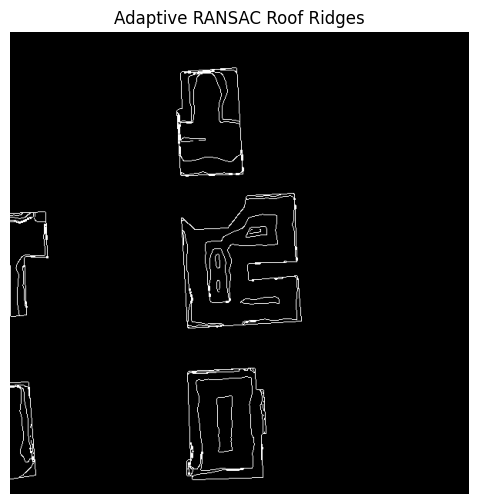

In [87]:
import numpy as np
import cv2
import open3d as o3d
import matplotlib.pyplot as plt
from sklearn.linear_model import RANSACRegressor

def dsm_to_point_cloud(dsm):
    """ Convert DSM to 3D point cloud (x, y, height). """
    h, w = dsm.shape
    x, y = np.meshgrid(np.arange(w), np.arange(h))
    points = np.column_stack((x.ravel(), y.ravel(), dsm.ravel()))
    return points, h, w  # Return height and width for later use

def fit_planes_ransac_dynamic(points, h, w, min_points=500, threshold=0.3):
    """ 
    Iteratively fit planes to the DSM using RANSAC until no significant inliers remain.
    - `min_points`: Minimum number of points required to fit a plane.
    - `threshold`: RANSAC inlier threshold (adjust to refine segmentation).
    """
    planes = []
    inlier_masks = []
    remaining_points = points.copy()

    while len(remaining_points) > min_points:
        # Fit a plane using RANSAC
        model = RANSACRegressor(residual_threshold=threshold)
        model.fit(remaining_points[:, :2], remaining_points[:, 2])  # Fit Z from (X, Y)

        # Get inliers
        inliers = model.inlier_mask_
        if np.sum(inliers) < min_points:  # Stop if too few inliers are found
            break

        # Store plane and inlier mask
        planes.append(model.estimator_.coef_)
        inlier_mask = np.zeros((h, w), dtype=bool)  # Use (h, w) instead of flat indexing

        # Ensure indices are within bounds
        x_idx = np.clip(remaining_points[:, 0].astype(int), 0, w - 1)
        y_idx = np.clip(remaining_points[:, 1].astype(int), 0, h - 1)

        # Assign inliers properly
        inlier_mask[y_idx, x_idx] = inliers
        inlier_masks.append(inlier_mask)

        # Remove inliers for next iteration
        remaining_points = remaining_points[~inliers]

    return planes, inlier_masks

def extract_ridges(dsm, inlier_masks):
    """ Extract ridges by detecting boundaries between different plane segments. """
    h, w = dsm.shape
    ridge_map = np.zeros((h, w), dtype=np.uint8)

    for mask in inlier_masks:
        edges = cv2.Canny(mask.astype(np.uint8) * 255, 50, 150)
        ridge_map = np.maximum(ridge_map, edges)

    return ridge_map

# Load masked DSM
#dsm_masked = np.load("your_masked_dsm.npy")

# Convert to point cloud
points, h, w = dsm_to_point_cloud(dsm_masked)

# Adaptive RANSAC Plane Extraction
planes, inlier_masks = fit_planes_ransac_dynamic(points, h, w, min_points=500, threshold=0.3)

# Extract ridges
ridge_map = extract_ridges(dsm_masked, inlier_masks)

# Visualize
plt.figure(figsize=(8, 6))
plt.imshow(ridge_map, cmap='gray')
plt.title("Adaptive RANSAC Roof Ridges")
plt.axis('off')
plt.show()


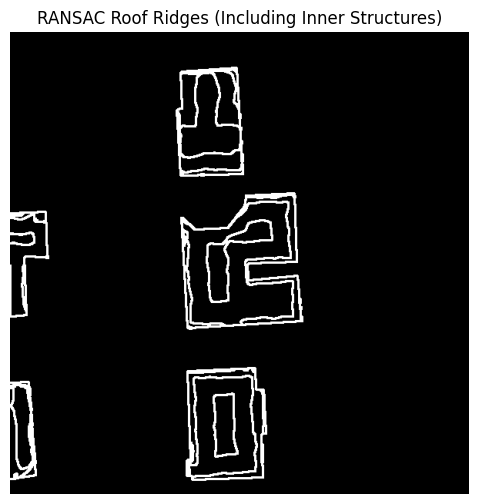

In [88]:
import numpy as np
import cv2
import open3d as o3d
import matplotlib.pyplot as plt
from sklearn.linear_model import RANSACRegressor

def dsm_to_point_cloud(dsm):
    """ Convert DSM to 3D point cloud (x, y, height). """
    h, w = dsm.shape
    x, y = np.meshgrid(np.arange(w), np.arange(h))
    points = np.column_stack((x.ravel(), y.ravel(), dsm.ravel()))
    return points, h, w  # Return height and width for later use

def fit_planes_ransac_dynamic(points, h, w, min_points=500, threshold=0.3):
    """ 
    Iteratively fit planes to the DSM using RANSAC until no significant inliers remain.
    - `min_points`: Minimum number of points required to fit a plane.
    - `threshold`: RANSAC inlier threshold (adjust to refine segmentation).
    """
    planes = []
    inlier_masks = []
    remaining_points = points.copy()

    while len(remaining_points) > min_points:
        # Fit a plane using RANSAC
        model = RANSACRegressor(residual_threshold=threshold)
        model.fit(remaining_points[:, :2], remaining_points[:, 2])  # Fit Z from (X, Y)

        # Get inliers
        inliers = model.inlier_mask_
        if np.sum(inliers) < min_points:  # Stop if too few inliers are found
            break

        # Store plane and inlier mask
        planes.append(model.estimator_.coef_)
        inlier_mask = np.zeros((h, w), dtype=bool)

        # Ensure indices are within bounds
        x_idx = np.clip(remaining_points[:, 0].astype(int), 0, w - 1)
        y_idx = np.clip(remaining_points[:, 1].astype(int), 0, h - 1)

        # Assign inliers properly
        inlier_mask[y_idx, x_idx] = inliers
        inlier_masks.append(inlier_mask)

        # Remove inliers for next iteration
        remaining_points = remaining_points[~inliers]

    return planes, inlier_masks

def extract_ridges(dsm, inlier_masks):
    """ Extract ridges by detecting boundaries between different plane segments. """
    h, w = dsm.shape
    ridge_map = np.zeros((h, w), dtype=np.uint8)

    for mask in inlier_masks:
        # Get boundary edges
        edges = cv2.Canny(mask.astype(np.uint8) * 255, 50, 150)

        # Use Sobel filters for inner ridges
        sobelx = cv2.Sobel(mask.astype(np.uint8), cv2.CV_64F, 1, 0, ksize=3)
        sobely = cv2.Sobel(mask.astype(np.uint8), cv2.CV_64F, 0, 1, ksize=3)
        sobel_edges = np.sqrt(sobelx**2 + sobely**2).astype(np.uint8)

        # Combine edges and ridges
        combined_edges = cv2.bitwise_or(edges, sobel_edges)

        # Morphological operations to highlight structures
        kernel = np.ones((3, 3), np.uint8)
        ridges = cv2.dilate(combined_edges, kernel, iterations=1)

        # Update ridge map
        ridge_map = np.maximum(ridge_map, ridges)

    return ridge_map

# Load masked DSM
#dsm_masked = np.load("your_masked_dsm.npy")

# Convert to point cloud
points, h, w = dsm_to_point_cloud(dsm_masked)

# Adaptive RANSAC Plane Extraction
planes, inlier_masks = fit_planes_ransac_dynamic(points, h, w, min_points=500, threshold=0.3)

# Extract ridges
ridge_map = extract_ridges(dsm_masked, inlier_masks)

# Visualize
plt.figure(figsize=(8, 6))
plt.imshow(ridge_map, cmap='gray')
plt.title("RANSAC Roof Ridges (Including Inner Structures)")
plt.axis('off')
plt.show()


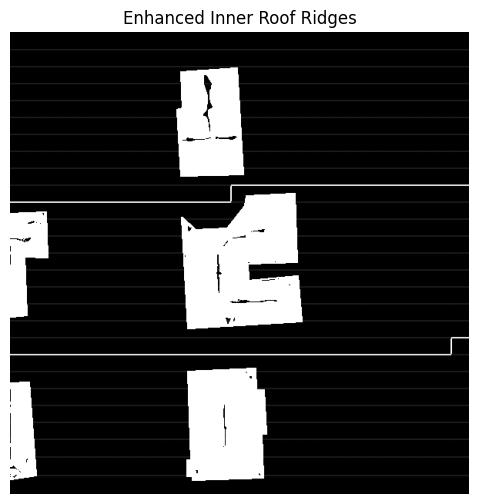

In [89]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from sklearn.linear_model import RANSACRegressor
from skimage.segmentation import slic
from skimage.color import rgb2gray
from skimage.util import img_as_ubyte

def dsm_to_point_cloud(dsm):
    """ Convert DSM to 3D point cloud (x, y, height). """
    h, w = dsm.shape
    x, y = np.meshgrid(np.arange(w), np.arange(h))
    points = np.column_stack((x.ravel(), y.ravel(), dsm.ravel()))
    return points, h, w

def fit_planes_ransac_dynamic(points, h, w, min_points=500, threshold=0.3):
    """ Fit planes iteratively using RANSAC """
    planes = []
    inlier_masks = []
    remaining_points = points.copy()

    while len(remaining_points) > min_points:
        model = RANSACRegressor(residual_threshold=threshold)
        model.fit(remaining_points[:, :2], remaining_points[:, 2])  

        inliers = model.inlier_mask_
        if np.sum(inliers) < min_points:
            break

        planes.append(model.estimator_.coef_)
        inlier_mask = np.zeros((h, w), dtype=bool)
        x_idx = np.clip(remaining_points[:, 0].astype(int), 0, w - 1)
        y_idx = np.clip(remaining_points[:, 1].astype(int), 0, h - 1)
        inlier_mask[y_idx, x_idx] = inliers
        inlier_masks.append(inlier_mask)

        remaining_points = remaining_points[~inliers]

    return planes, inlier_masks

def extract_ridges(dsm, inlier_masks):
    """ Extract ridges using a combination of SLIC and Sobel gradients. """
    h, w = dsm.shape
    ridge_map = np.zeros((h, w), dtype=np.uint8)

    # Apply SLIC segmentation for more detailed region grouping
    num_segments = max(h * w // 500, 150)  # Adaptive segment count
    slic_segments = slic(dsm, n_segments=num_segments, compactness=10, start_label=0,channel_axis=None)
    
    for mask in inlier_masks:
        edges = cv2.Canny(mask.astype(np.uint8) * 255, 50, 150)

        # Local gradient detection for inner ridges
        grad_x = cv2.Sobel(dsm, cv2.CV_64F, 1, 0, ksize=3)
        grad_y = cv2.Sobel(dsm, cv2.CV_64F, 0, 1, ksize=3)
        gradient_magnitude = np.sqrt(grad_x**2 + grad_y**2)

        # Threshold gradient to highlight ridges
        ridge_threshold = np.percentile(gradient_magnitude, 85)
        ridge_map[gradient_magnitude > ridge_threshold] = 255

        # Merge with Canny and SLIC edges
        slic_edges = cv2.Laplacian(slic_segments.astype(np.uint8), cv2.CV_64F)
        ridge_map = np.maximum(ridge_map, np.abs(slic_edges).astype(np.uint8))
        ridge_map = np.maximum(ridge_map, edges)

    return ridge_map

# Load masked DSM
#dsm_masked = np.load("your_masked_dsm.npy")

# Convert to point cloud
points, h, w = dsm_to_point_cloud(dsm_masked)

# Adaptive RANSAC Plane Extraction
planes, inlier_masks = fit_planes_ransac_dynamic(points, h, w, min_points=500, threshold=0.3)

# Extract ridges
ridge_map = extract_ridges(dsm_masked, inlier_masks)

# Visualize
plt.figure(figsize=(8, 6))
plt.imshow(ridge_map, cmap='gray')
plt.title("Enhanced Inner Roof Ridges")
plt.axis('off')
plt.show()


Before further experimentation what has worked till now slic and ransac on dsm after normal vector smoothing --- not entirely the solution I am looking for but its an improvement .
Future venue --- introduce this dsm slic ransac in post-processing 

Of course after further experimentations

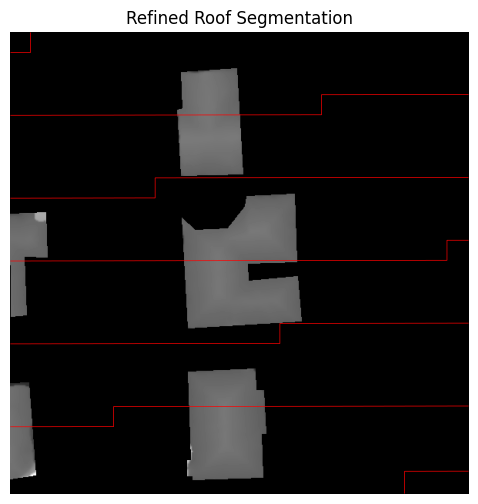

In [90]:
import numpy as np
import cv2
import open3d as o3d
import matplotlib.pyplot as plt
from sklearn.linear_model import RANSACRegressor
from skimage.segmentation import slic

def dsm_to_point_cloud(dsm):
    """ Convert DSM to 3D point cloud (x, y, height). """
    h, w = dsm.shape
    x, y = np.meshgrid(np.arange(w), np.arange(h))
    points = np.column_stack((x.ravel(), y.ravel(), dsm.ravel()))
    return points

def fit_planes_ransac_dynamic(points, segments, min_points=500, threshold=0.3):
    """ 
    Iteratively fit planes to the DSM using RANSAC per segment.
    - `segments`: SLIC segmented regions.
    - `min_points`: Minimum number of points required to fit a plane.
    - `threshold`: RANSAC inlier threshold.
    """
    planes = []
    inlier_masks = []
    
    unique_segments = np.unique(segments)  # Get unique segment labels

    for segment_id in unique_segments:
        region_mask = segments == segment_id  # Get mask for current region
        valid_indices = np.where(region_mask.ravel())[0]  # Get valid indices
        
        if len(valid_indices) < min_points:
            continue  # Skip small segments

        points_in_region = points[valid_indices]  # Extract relevant points
        
        # Fit RANSAC model
        model = RANSACRegressor(residual_threshold=threshold)
        model.fit(points_in_region[:, :2], points_in_region[:, 2])  # Fit Z from (X, Y)

        # Get inliers
        inliers = model.inlier_mask_
        if inliers is None or np.sum(inliers) < min_points:
            continue  # Skip if no good fit

        planes.append(model.estimator_.coef_)

        inlier_mask = np.zeros(points.shape[0], dtype=bool)
        inlier_mask[valid_indices[inliers]] = True  # Assign inliers
        inlier_masks.append(inlier_mask)

    return planes, inlier_masks

def extract_ridges(dsm, inlier_masks):
    """ Extract ridges by detecting boundaries between different plane segments. """
    h, w = dsm.shape
    ridge_map = np.zeros((h, w), dtype=np.uint8)

    for mask in inlier_masks:
        mask_reshaped = mask.reshape(h, w)
        edges = cv2.Canny(mask_reshaped.astype(np.uint8) * 255, 50, 150)
        ridge_map = np.maximum(ridge_map, edges)

    return ridge_map

# Load masked DSM
#dsm_masked = np.load("your_masked_dsm.npy")

# Convert to point cloud
points = dsm_to_point_cloud(dsm_masked)

# Apply SLIC segmentation
segments = slic(dsm_masked, n_segments=500, compactness=50, start_label=0,channel_axis=None)

# Adaptive RANSAC Plane Extraction
planes, inlier_masks = fit_planes_ransac_dynamic(points, segments, min_points=500, threshold=0.3)

# Extract ridges
ridge_map = extract_ridges(dsm_masked, inlier_masks)

# Visualize
plt.figure(figsize=(8, 6))
plt.imshow(dsm_masked, cmap='gray')
plt.contour(segments, colors='red', linewidths=0.5)  # Show segment boundaries
plt.title("Refined Roof Segmentation")
plt.axis('off')
plt.show()

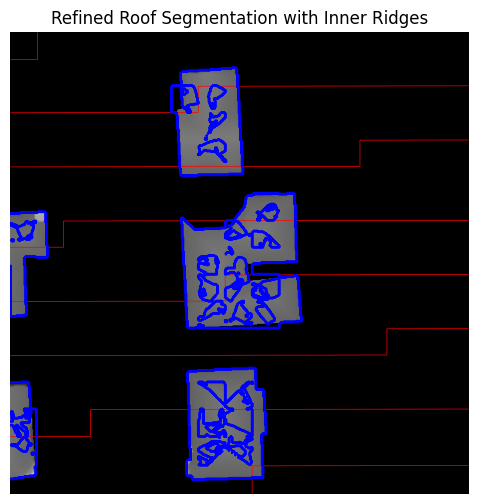

In [91]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from skimage.segmentation import slic
from skimage.util import img_as_float
from sklearn.linear_model import RANSACRegressor

def dsm_to_point_cloud(dsm):
    """ Convert DSM to 3D point cloud (x, y, height). """
    h, w = dsm.shape
    x, y = np.meshgrid(np.arange(w), np.arange(h))
    points = np.column_stack((x.ravel(), y.ravel(), dsm.ravel()))
    return points, h, w  # Return dimensions too

def fit_planes_ransac_dynamic(points, segments, h, w, min_points=100, threshold=0.01):
    """ Fit planes to DSM using RANSAC per SLIC segment. """
    unique_segments = np.unique(segments)
    plane_masks = np.zeros((h, w), dtype=np.uint8)

    for seg_id in unique_segments:
        mask = (segments == seg_id)
        segment_points = points[mask.ravel()]  # Ensure correct indexing

        if len(segment_points) < min_points:
            continue  # Skip small segments

        model = RANSACRegressor(residual_threshold=threshold)
        model.fit(segment_points[:, :2], segment_points[:, 2])  # Fit Z from (X, Y)

        # Get inliers & reshape correctly
        inliers = model.inlier_mask_
        inlier_mask = np.zeros_like(mask, dtype=np.uint8)
        inlier_mask[mask] = inliers  # **Fixed indexing issue!**

        plane_masks = np.maximum(plane_masks, inlier_mask)

    return plane_masks

def extract_ridges(plane_masks):
    """ Extract inner ridges from segmented planes. """
    edges = cv2.Canny((plane_masks * 255).astype(np.uint8), 50, 150)
    return edges

# Load masked DSM
#dsm_masked = np.load("your_masked_dsm.npy")

# Normalize DSM for SLIC
dsm_float = img_as_float(dsm_masked)

# Apply SLIC Superpixel Segmentation (Refined)
segments = slic(dsm_float, n_segments=300, compactness=20, start_label=0,channel_axis=None)

# Convert DSM to point cloud
points, h, w = dsm_to_point_cloud(dsm_masked)

# Apply RANSAC plane fitting per segment
plane_masks = fit_planes_ransac_dynamic(points, segments, h, w, min_points=100, threshold=0.01)

# Extract inner ridges
ridge_map = extract_ridges(plane_masks)

# **Enhanced Visualization**
plt.figure(figsize=(8, 6))
plt.imshow(dsm_masked, cmap='gray')
plt.contour(segments, colors='red', linewidths=0.5)  # Highlight finer segments
plt.contour(ridge_map, colors='blue', linewidths=0.8)  # Show extracted ridges
plt.title("Refined Roof Segmentation with Inner Ridges")
plt.axis('off')
plt.show()


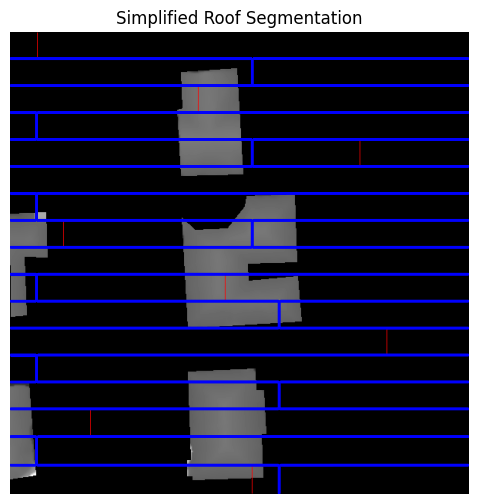

In [92]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from skimage.segmentation import slic
from sklearn.linear_model import RANSACRegressor

def dsm_to_point_cloud(dsm):
    """ Convert DSM to 3D point cloud (x, y, height). """
    h, w = dsm.shape
    x, y = np.meshgrid(np.arange(w), np.arange(h))
    points = np.column_stack((x.ravel(), y.ravel(), dsm.ravel()))
    return points, h, w

def fit_planes_ransac(points, segments, min_points=100, threshold=0.01):
    """ Apply RANSAC per SLIC segment. """
    unique_segments = np.unique(segments)
    plane_masks = np.zeros_like(segments, dtype=np.uint8)

    for seg_id in unique_segments:
        mask = (segments == seg_id)
        segment_points = points[mask.ravel()]  

        if len(segment_points) < min_points:
            continue

        model = RANSACRegressor(residual_threshold=threshold)
        model.fit(segment_points[:, :2], segment_points[:, 2])  

        inliers = model.inlier_mask_
        plane_masks[mask] = inliers.astype(np.uint8)

    return plane_masks

def extract_ridges(segments):
    """ Extract edges from SLIC segmentation. """
    edges = cv2.Canny((segments * 10).astype(np.uint8), 50, 150)
    return edges

# Load DSM
#dsm_masked = np.load("your_masked_dsm.npy")

# Apply SLIC Superpixel Segmentation
segments = slic(dsm_masked, n_segments=300, compactness=20, start_label=0,channel_axis=None)

# Convert DSM to point cloud
points, h, w = dsm_to_point_cloud(dsm_masked)

# Apply RANSAC to detect planes
plane_masks = fit_planes_ransac(points, segments)

# Extract ridge map
ridge_map = extract_ridges(segments)

# Visualization
plt.figure(figsize=(8, 6))
plt.imshow(dsm_masked, cmap='gray')
plt.contour(segments, colors='red', linewidths=0.5)  # SLIC boundaries
plt.contour(ridge_map, colors='blue', linewidths=0.8)  # Extracted edges
plt.title("Simplified Roof Segmentation")
plt.axis('off')
plt.show()


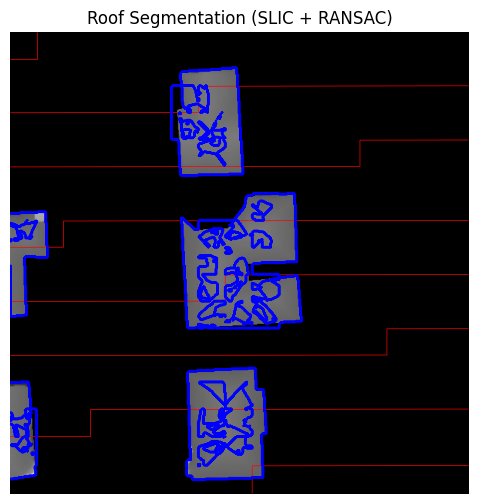

In [93]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from skimage.segmentation import slic
from sklearn.linear_model import RANSACRegressor

def apply_slic(dsm, n_segments=300, compactness=20):
    """ Apply SLIC superpixel segmentation to DSM. """
    return slic(dsm, n_segments=n_segments, compactness=compactness, start_label=0,channel_axis=None)

def fit_ransac_planes(dsm, segments, min_points=50, threshold=0.01):
    """ Fit planes using RANSAC within each SLIC superpixel. """
    h, w = dsm.shape
    plane_mask = np.zeros((h, w), dtype=np.uint8)
    
    unique_segments = np.unique(segments)
    for seg_id in unique_segments:
        mask = (segments == seg_id)
        yx = np.column_stack(np.where(mask))  # Extract Y, X
        z = dsm[mask]  # Heights

        if len(z) < min_points:
            continue

        model = RANSACRegressor(residual_threshold=threshold)
        model.fit(yx, z)  # Fit Z from (Y, X)

        inliers = model.inlier_mask_
        plane_mask[mask] = inliers.astype(np.uint8) * 255  

    return plane_mask

def extract_edges(plane_mask):
    """ Extract ridges/edges from segmented DSM. """
    return cv2.Canny(plane_mask, 50, 150)

# Load DSM
#dsm_masked = np.load("your_masked_dsm.npy")

# Step 1: Apply SLIC
segments = apply_slic(dsm_masked)

# Step 2: Apply RANSAC per segment
plane_mask = fit_ransac_planes(dsm_masked, segments)

# Step 3: Extract Edges
ridge_map = extract_edges(plane_mask)

# Visualization
plt.figure(figsize=(8, 6))
plt.imshow(dsm_masked, cmap='gray')
plt.contour(segments, colors='red', linewidths=0.5)  # Superpixel boundaries
plt.contour(ridge_map, colors='blue', linewidths=0.8)  # Extracted ridges
plt.title("Roof Segmentation (SLIC + RANSAC)")
plt.axis('off')
plt.show()


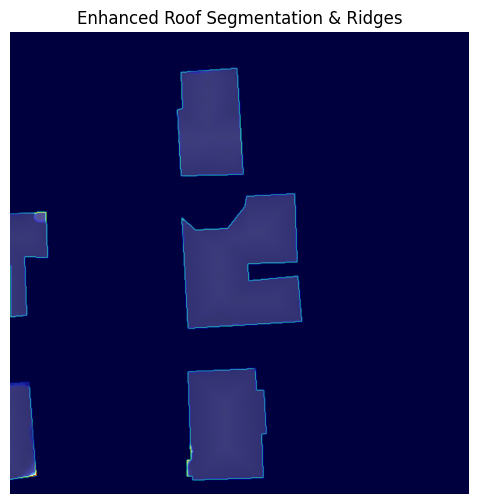

In [94]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from sklearn.linear_model import RANSACRegressor
from skimage.segmentation import slic
from skimage.util import img_as_ubyte

def dsm_to_point_cloud(dsm):
    """ Convert DSM to 3D point cloud (x, y, height). """
    h, w = dsm.shape
    x, y = np.meshgrid(np.arange(w), np.arange(h))
    points = np.column_stack((x.ravel(), y.ravel(), dsm.ravel()))
    return points, h, w

def fit_planes_ransac_dynamic(points, h, w, min_points=500, threshold=0.1):
    """ Fit planes iteratively using RANSAC """
    
    planes = []
    inlier_masks = []
    remaining_points = points.copy()

    while len(remaining_points) > min_points:
        model = RANSACRegressor(residual_threshold=threshold)
        model.fit(remaining_points[:, :2], remaining_points[:, 2])  

        inliers = model.inlier_mask_
        if np.sum(inliers) < min_points:
            break

        planes.append(model.estimator_.coef_)
        inlier_mask = np.zeros((h, w), dtype=bool)
        x_idx = np.clip(remaining_points[:, 0].astype(int), 0, w - 1)
        y_idx = np.clip(remaining_points[:, 1].astype(int), 0, h - 1)
        inlier_mask[y_idx, x_idx] = inliers
        inlier_masks.append(inlier_mask)

        remaining_points = remaining_points[~inliers]

    return planes, inlier_masks

def extract_ridges(dsm, inlier_masks):
    """ Extract ridges using a combination of SLIC, Scharr, and Laplacian filters. """
    dsm = dsm.astype(np.float32)
    h, w = dsm.shape
    ridge_map = np.zeros((h, w), dtype=np.uint8)

    # Adaptive SLIC segmentation
    num_segments = max(h * w // 500, 150)  # Adaptive segment count
    compactness_value = 5 if np.std(dsm) > 5 else 20  # Lower compactness for complex roofs
    slic_segments = slic(dsm, n_segments=num_segments, compactness=compactness_value, start_label=0, channel_axis=None)

    for mask in inlier_masks:
        edges = cv2.Canny(mask.astype(np.uint8) * 255, 50, 150)

        # Scharr filter for sharper edge detection
        grad_x = cv2.Scharr(dsm, cv2.CV_32F, 1, 0)
        grad_y = cv2.Scharr(dsm, cv2.CV_32F, 0, 1)
        gradient_magnitude = np.sqrt(grad_x**2 + grad_y**2)

        # Thresholding gradient magnitudes
        ridge_threshold = np.percentile(gradient_magnitude, 85)
        ridge_map[gradient_magnitude > ridge_threshold] = 255

        # Laplacian for finer ridge detection
        laplacian = cv2.Laplacian(dsm, cv2.CV_32F)
        ridge_map = np.maximum(ridge_map, np.abs(laplacian).astype(np.uint8))

        # Merge with SLIC and Canny
        slic_edges = cv2.Laplacian(slic_segments.astype(np.uint8), cv2.CV_64F)
        ridge_map = cv2.convertScaleAbs(gradient_magnitude)
        laplacian = cv2.convertScaleAbs(laplacian)

    # Morphological closing to connect weak edges
    kernel = np.ones((3, 3), np.uint8)
    ridge_map = cv2.morphologyEx(ridge_map, cv2.MORPH_CLOSE, kernel)

    return ridge_map

# Load masked DSM
# dsm_masked = np.load("your_masked_dsm.npy")

# Convert to point cloud
points, h, w = dsm_to_point_cloud(dsm_masked)

# Adaptive RANSAC Plane Extraction
planes, inlier_masks = fit_planes_ransac_dynamic(points, h, w, min_points=500, threshold=0.1)

# Extract ridges
ridge_map = extract_ridges(dsm_masked, inlier_masks)

# Visualize - Overlay ridges on DSM
plt.figure(figsize=(8, 6))
plt.imshow(dsm_masked, cmap='gray')
plt.imshow(ridge_map, cmap='jet', alpha=0.5)  # Overlay with transparency
plt.title("Enhanced Roof Segmentation & Ridges")
plt.axis('off')
plt.show()


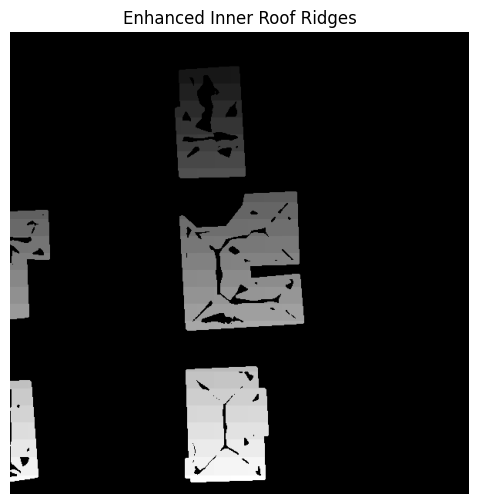

In [95]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from sklearn.linear_model import RANSACRegressor
from skimage.segmentation import slic, watershed
from skimage.util import img_as_ubyte

def dsm_to_point_cloud(dsm):
    """ Convert DSM to 3D point cloud (x, y, height). """
    h, w = dsm.shape
    x, y = np.meshgrid(np.arange(w), np.arange(h))
    points = np.column_stack((x.ravel(), y.ravel(), dsm.ravel()))
    return points, h, w

def fit_planes_ransac_dynamic(points, h, w, min_points=500, threshold=0.3):
    """ Fit planes iteratively using RANSAC """
    planes = []
    inlier_masks = []
    remaining_points = points.copy()

    while len(remaining_points) > min_points:
        model = RANSACRegressor(residual_threshold=threshold)
        model.fit(remaining_points[:, :2], remaining_points[:, 2])  

        inliers = model.inlier_mask_
        if np.sum(inliers) < min_points:
            break

        planes.append(model.estimator_.coef_)
        inlier_mask = np.zeros((h, w), dtype=bool)
        x_idx = np.clip(remaining_points[:, 0].astype(int), 0, w - 1)
        y_idx = np.clip(remaining_points[:, 1].astype(int), 0, h - 1)
        inlier_mask[y_idx, x_idx] = inliers
        inlier_masks.append(inlier_mask)

        remaining_points = remaining_points[~inliers]

    return planes, inlier_masks

def extract_ridges(dsm, inlier_masks):
    """ Extract inner roof ridges using multi-scale filters and segmentation. """
    h, w = dsm.shape
    ridge_map = np.zeros((h, w), dtype=np.uint8)

    # Ensure DSM is float32 for OpenCV filters
    dsm = dsm.astype(np.float32)

    # Multi-scale gradient filtering
    grad_x_small = cv2.Sobel(dsm, cv2.CV_32F, 1, 0, ksize=3)
    grad_y_small = cv2.Sobel(dsm, cv2.CV_32F, 0, 1, ksize=3)
    grad_x_large = cv2.Sobel(dsm, cv2.CV_32F, 1, 0, ksize=7)
    grad_y_large = cv2.Sobel(dsm, cv2.CV_32F, 0, 1, ksize=7)

    # Combine multi-scale gradients
    gradient_magnitude = np.sqrt((grad_x_small**2 + grad_y_small**2) + (grad_x_large**2 + grad_y_large**2))

    # Adaptive thresholding to capture ridges
    ridge_threshold = np.percentile(gradient_magnitude, 85)
    ridge_map[gradient_magnitude > ridge_threshold] = 255

    # Laplacian to enhance inner edges
    laplacian = cv2.Laplacian(dsm, cv2.CV_32F, ksize=3)
    laplacian = cv2.convertScaleAbs(laplacian)
    ridge_map = np.maximum(ridge_map, laplacian)

    # Apply SLIC segmentation for refined ridge grouping
    num_segments = max(h * w // 500, 150)
    slic_segments = slic(dsm, n_segments=num_segments, compactness=10, start_label=0, channel_axis=None)

    # Use watershed segmentation on SLIC edges
    markers = slic_segments + 1
    watershed_segmentation = watershed(-ridge_map, markers, mask=ridge_map > 0)

    return watershed_segmentation

# Load masked DSM
# dsm_masked = np.load("your_masked_dsm.npy")

# Convert to point cloud
points, h, w = dsm_to_point_cloud(dsm_masked)

# Adaptive RANSAC Plane Extraction
planes, inlier_masks = fit_planes_ransac_dynamic(points, h, w, min_points=500, threshold=0.3)

# Extract ridges
ridge_map = extract_ridges(dsm_masked, inlier_masks)

# Visualize
plt.figure(figsize=(8, 6))
plt.imshow(ridge_map, cmap='gray')
plt.title("Enhanced Inner Roof Ridges")
plt.axis('off')
plt.show()

In [96]:
dsm_padded = np.pad(dsm_masked, ((0, 0), (0, 1)), mode='edge')


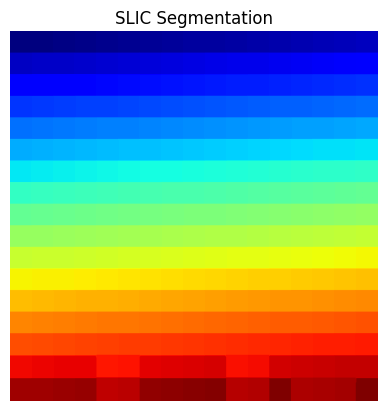

In [97]:
import numpy as np
from skimage.segmentation import slic
from skimage.color import rgb2lab
import cv2  # For visualization

def slic_with_rgb_dsm(rgb_img, dsm, num_segments=300, compactness=10):
    """ Apply SLIC to combined RGB + DSM feature space with shape handling """

    # Ensure shapes match by cropping RGB to fit DSM
    if rgb_img.shape[1] > dsm.shape[1]:
        rgb_img = rgb_img[:, :dsm.shape[1], :]

    # Normalize DSM to 0-255
    dsm_scaled = (dsm - dsm.min()) / (dsm.max() - dsm.min()) * 255  

    # Convert RGB to Lab color space
    rgb_lab = rgb2lab(rgb_img)  

    # Stack RGB and DSM as a 4D feature space
    features = np.dstack((rgb_lab, dsm_scaled))

    # Apply SLIC on combined features
    slic_segments = slic(features, n_segments=num_segments, compactness=compactness, start_label=0, channel_axis=-1)

    return slic_segments

# Example visualization
rgb_img = cv2.imread("25.9231767_-80.18102429999999_nearmap_rgb.tif")  # Load your RGB image
# dsm = np.load("your_dsm.npy")  # Load DSM data
segments = slic_with_rgb_dsm(rgb_img, dsm)
plt.imshow(segments, cmap="jet")
plt.axis("off")
plt.title("SLIC Segmentation")
plt.show()


In [98]:
rgb_img = cv2.imread("25.9231767_-80.18102429999999_nearmap_rgb.tif")
print("RGB Image Shape:", rgb_image.shape)  # Should be (600, 597, 3)
print("DSM Shape:", dsm_masked.shape)    

RGB Image Shape: (3, 600, 597)
DSM Shape: (600, 596)


In [99]:
rgb_image = np.transpose(rgb_image, (1, 2, 0))
print("Fixed RGB Shape:", rgb_image.shape)

Fixed RGB Shape: (600, 597, 3)


In [100]:
rgb_image = cv2.resize(rgb_image, (dsm.shape[1], dsm.shape[0]))
print("Final RGB Shape:", rgb_image.shape)  # Should be (600, 596, 3)
print("Final DSM Shape:", dsm.shape)        # Should be (600, 596)

Final RGB Shape: (600, 596, 3)
Final DSM Shape: (600, 596)


In [101]:
from PIL import Image
import rasterio
import numpy as np

# Load RGB Image using Pillow (PIL)
rgb_image = Image.open("25.9231767_-80.18102429999999_nearmap_rgb.tif")
rgb_array = np.array(rgb_image)

# Load DSM using Rasterio
dsm_array=dsm_masked # Read first band

# Ensure RGB shape is consistent
if len(rgb_array.shape) == 3 and rgb_array.shape[-1] > 3:  # Handle extra channels
    rgb_array = rgb_array[:, :, :3]  # Keep only RGB channels

# Ensure correct dtype (Normalize if needed)
if rgb_array.dtype != np.uint8:
    rgb_array = (255 * (rgb_array - rgb_array.min()) / (rgb_array.max() - rgb_array.min())).astype(np.uint8)

# Get target DSM dimensions
h_dsm, w_dsm = dsm_array.shape

# Resize RGB Image to match DSM dimensions using PIL
rgb_resized = Image.fromarray(rgb_array).resize((w_dsm, h_dsm), Image.BILINEAR)
rgb_resized = np.array(rgb_resized)  # Convert back to NumPy array

print("✅ RGB Image successfully resized to match DSM dimensions.")
print(f"New RGB Shape: {rgb_resized.shape}, DSM Shape: {dsm_array.shape}")


✅ RGB Image successfully resized to match DSM dimensions.
New RGB Shape: (600, 596, 3), DSM Shape: (600, 596)


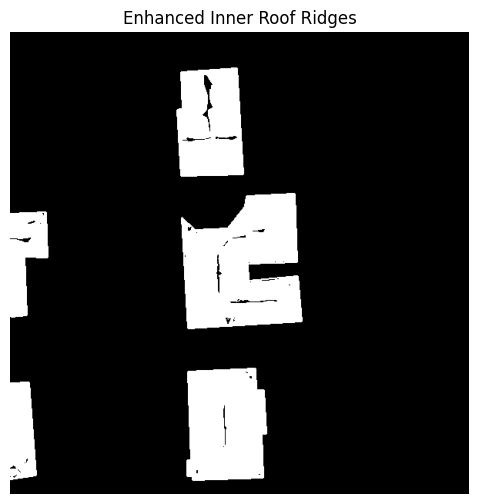

In [102]:
import numpy as np
import rasterio
import matplotlib.pyplot as plt
from sklearn.linear_model import RANSACRegressor
from skimage.segmentation import slic
from skimage.filters import sobel
from skimage.color import rgb2gray
from skimage.util import img_as_ubyte
from PIL import Image

def load_tiff(file_path):
    """Load a TIFF image using rasterio."""
    with rasterio.open(file_path) as src:
        img = src.read()
    return img

def preprocess_images(rgb, dsm):
    """Ensure RGB and DSM are aligned in size."""
    rgb_resized = np.transpose(rgb, (1, 2, 0))  # Change shape from (3, H, W) to (H, W, 3)
    
    # Resize RGB to match DSM shape
    rgb_resized = np.array(Image.fromarray(rgb_resized).resize((dsm.shape[1], dsm.shape[0])))
    return rgb_resized, dsm

def dsm_to_point_cloud(dsm):
    """Convert DSM to 3D point cloud (x, y, height)."""
    h, w = dsm.shape
    x, y = np.meshgrid(np.arange(w), np.arange(h))
    points = np.column_stack((x.ravel(), y.ravel(), dsm.ravel()))
    return points, h, w

def fit_planes_ransac_dynamic(points, h, w, min_points=500, threshold=0.3):
    """Fit planes iteratively using RANSAC."""
    planes = []
    inlier_masks = []
    remaining_points = points.copy()

    while len(remaining_points) > min_points:
        model = RANSACRegressor(residual_threshold=threshold)
        model.fit(remaining_points[:, :2], remaining_points[:, 2])  

        inliers = model.inlier_mask_
        if np.sum(inliers) < min_points:
            break

        planes.append(model.estimator_.coef_)
        inlier_mask = np.zeros((h, w), dtype=bool)
        x_idx = np.clip(remaining_points[:, 0].astype(int), 0, w - 1)
        y_idx = np.clip(remaining_points[:, 1].astype(int), 0, h - 1)
        inlier_mask[y_idx, x_idx] = inliers
        inlier_masks.append(inlier_mask)

        remaining_points = remaining_points[~inliers]

    return planes, inlier_masks

def extract_ridges(dsm, inlier_masks, rgb):
    """Extract ridges using SLIC and Sobel gradients."""
    h, w = dsm.shape
    ridge_map = np.zeros((h, w), dtype=np.uint8)

    # Convert RGB to grayscale for segmentation
    gray_rgb = rgb2gray(rgb)

    # Apply SLIC segmentation (superpixels)
    num_segments = max(h * w // 500, 150)
    slic_segments = slic(gray_rgb, n_segments=num_segments, compactness=10, start_label=0, channel_axis=None)

    for mask in inlier_masks:
        edges = sobel(mask.astype(np.uint8))

        # Local gradient detection
        grad_x = np.gradient(dsm, axis=1)
        grad_y = np.gradient(dsm, axis=0)
        gradient_magnitude = np.sqrt(grad_x**2 + grad_y**2)

        # Threshold to highlight ridges
        ridge_threshold = np.percentile(gradient_magnitude, 85)
        ridge_map[gradient_magnitude > ridge_threshold] = 255

        # Merge with Sobel and SLIC edges
        slic_edges = sobel(slic_segments)
        ridge_map = np.maximum(ridge_map, np.abs(slic_edges).astype(np.uint8))
        ridge_map = np.maximum(ridge_map, edges)

    return ridge_map

# Load images
rgb = load_tiff("25.9231767_-80.18102429999999_nearmap_rgb.tif")
dsm = dsm_masked  # Take the first band if single-channel DSM

# Preprocess
rgb_resized, dsm = preprocess_images(rgb, dsm)

# Convert DSM to point cloud
points, h, w = dsm_to_point_cloud(dsm)

# Adaptive RANSAC Plane Extraction
planes, inlier_masks = fit_planes_ransac_dynamic(points, h, w, min_points=500, threshold=0.3)

# Extract ridges
ridge_map = extract_ridges(dsm, inlier_masks, rgb_resized)

# Visualize
plt.figure(figsize=(8, 6))
plt.imshow(ridge_map, cmap='gray')
plt.title("Enhanced Inner Roof Ridges")
plt.axis('off')
plt.show()


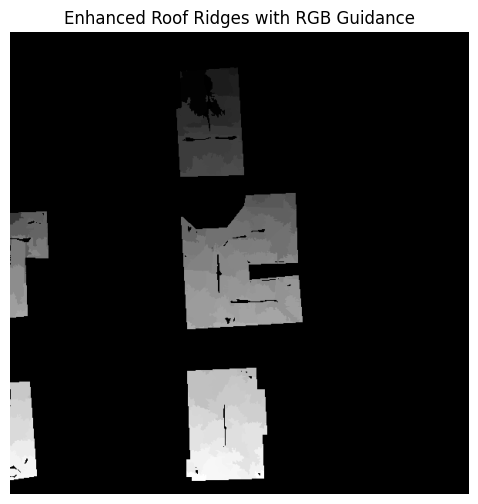

In [103]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from sklearn.linear_model import RANSACRegressor
from skimage.segmentation import slic, watershed
from skimage.filters import sobel
from skimage.util import img_as_ubyte

# Load DSM TIFF
def load_dsm(dsm_path):
    dsm = Image.open(dsm_path)
    dsm = np.array(dsm, dtype=np.float32)  # Convert to float for processing
    return dsm

# Load and align RGB TIFF
def load_rgb(rgb_path, target_shape):
    rgb = Image.open(rgb_path)
    rgb = np.array(rgb)  # Convert to NumPy array
    
    # Ensure RGB is transposed & resized to match DSM shape
    rgb = np.transpose(rgb, (1, 0, 2)) if rgb.shape[:2] != target_shape else rgb
    rgb = np.array(Image.fromarray(rgb).resize((target_shape[1], target_shape[0])))  # Resize to DSM shape
    
    return rgb

# Convert DSM to 3D point cloud
def dsm_to_point_cloud(dsm):
    h, w = dsm.shape
    x, y = np.meshgrid(np.arange(w), np.arange(h))
    points = np.column_stack((x.ravel(), y.ravel(), dsm.ravel()))
    return points, h, w

# Adaptive RANSAC plane extraction
def fit_planes_ransac_dynamic(points, h, w, min_points=500, threshold=0.3):
    planes = []
    inlier_masks = []
    remaining_points = points.copy()

    while len(remaining_points) > min_points:
        model = RANSACRegressor(residual_threshold=threshold)
        model.fit(remaining_points[:, :2], remaining_points[:, 2])  

        inliers = model.inlier_mask_
        if np.sum(inliers) < min_points:
            break

        planes.append(model.estimator_.coef_)
        inlier_mask = np.zeros((h, w), dtype=bool)
        x_idx = np.clip(remaining_points[:, 0].astype(int), 0, w - 1)
        y_idx = np.clip(remaining_points[:, 1].astype(int), 0, h - 1)
        inlier_mask[y_idx, x_idx] = inliers
        inlier_masks.append(inlier_mask)

        remaining_points = remaining_points[~inliers]

    return planes, inlier_masks

# Extract inner roof ridges using RGB-guided segmentation
def extract_ridges(dsm, rgb, inlier_masks):
    h, w = dsm.shape
    ridge_map = np.zeros((h, w), dtype=np.uint8)

    # Compute Sobel gradient magnitude
    sobel_edges = sobel(dsm)

    # Use SLIC segmentation with RGB guidance
    num_segments = max(h * w // 500, 150)
    slic_segments = slic(rgb, n_segments=num_segments, compactness=10, start_label=0)

    # Apply watershed segmentation to refine ridge extraction
    markers = slic_segments + 1
    watershed_segmentation = watershed(-sobel_edges, markers, mask=sobel_edges > np.percentile(sobel_edges, 85))

    return watershed_segmentation

# Load images
#sm_path = "your_dsm.tif"
rgb_path = "25.9231767_-80.18102429999999_nearmap_rgb.tif"

dsm_masked = dsm_masked
rgb_aligned = load_rgb(rgb_path, dsm_masked.shape)

# Convert DSM to point cloud
points, h, w = dsm_to_point_cloud(dsm_masked)

# Fit planes using RANSAC
planes, inlier_masks = fit_planes_ransac_dynamic(points, h, w, min_points=500, threshold=0.3)

# Extract roof ridges using RGB & DSM
ridge_map = extract_ridges(dsm_masked, rgb_aligned, inlier_masks)

# Visualize results
plt.figure(figsize=(8, 6))
plt.imshow(ridge_map, cmap='gray')
plt.title("Enhanced Roof Ridges with RGB Guidance")
plt.axis('off')
plt.show()


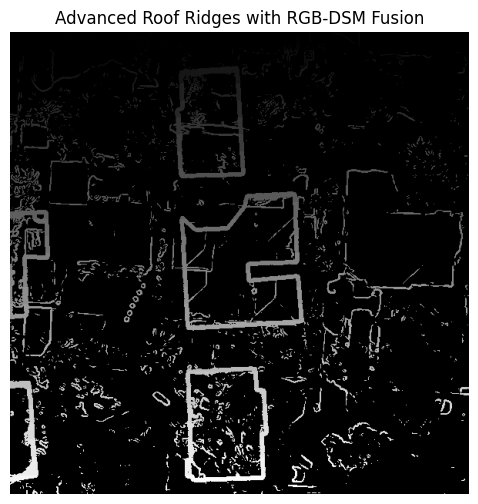

In [104]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from sklearn.linear_model import RANSACRegressor
from skimage.segmentation import slic, watershed
from skimage.filters import sobel
from skimage.util import img_as_ubyte
from skimage.color import rgb2gray
from scipy.ndimage import gaussian_gradient_magnitude

# Load DSM TIFF
def load_dsm(dsm_path):
    dsm = Image.open(dsm_path)
    dsm = np.array(dsm, dtype=np.float32)  # Convert to float for processing
    return dsm

# Load and align RGB TIFF
def load_rgb(rgb_path, target_shape):
    rgb = Image.open(rgb_path)
    rgb = np.array(rgb)  # Convert to NumPy array

    # Ensure RGB is transposed & resized to match DSM shape
    rgb = np.transpose(rgb, (1, 0, 2)) if rgb.shape[:2] != target_shape else rgb
    rgb = np.array(Image.fromarray(rgb).resize((target_shape[1], target_shape[0])))  # Resize to DSM shape

    return rgb

# Convert DSM to 3D point cloud
def dsm_to_point_cloud(dsm):
    h, w = dsm.shape
    x, y = np.meshgrid(np.arange(w), np.arange(h))
    points = np.column_stack((x.ravel(), y.ravel(), dsm.ravel()))
    return points, h, w

# Adaptive RANSAC plane extraction
def fit_planes_ransac_dynamic(points, h, w, min_points=500, threshold=0.3):
    planes = []
    inlier_masks = []
    remaining_points = points.copy()

    while len(remaining_points) > min_points:
        model = RANSACRegressor(residual_threshold=threshold)
        model.fit(remaining_points[:, :2], remaining_points[:, 2])  

        inliers = model.inlier_mask_
        if np.sum(inliers) < min_points:
            break

        planes.append(model.estimator_.coef_)
        inlier_mask = np.zeros((h, w), dtype=bool)
        x_idx = np.clip(remaining_points[:, 0].astype(int), 0, w - 1)
        y_idx = np.clip(remaining_points[:, 1].astype(int), 0, h - 1)
        inlier_mask[y_idx, x_idx] = inliers
        inlier_masks.append(inlier_mask)

        remaining_points = remaining_points[~inliers]

    return planes, inlier_masks

# Extract inner roof ridges using Advanced RGB-DSM Fusion
def extract_ridges_advanced(dsm, rgb, inlier_masks):
    h, w = dsm.shape
    ridge_map = np.zeros((h, w), dtype=np.uint8)

    # Convert RGB to grayscale for edge enhancement
    rgb_gray = rgb2gray(rgb)

    # Compute Sobel gradient magnitude for DSM & RGB
    sobel_dsm = sobel(dsm)
    sobel_rgb = sobel(rgb_gray)

    # Gaussian gradient magnitude for smooth edge detection
    grad_dsm = gaussian_gradient_magnitude(dsm, sigma=1)
    grad_rgb = gaussian_gradient_magnitude(rgb_gray, sigma=1)

    # Weighted combination of edges (RGB + DSM)
    fused_gradient = 0.6 * grad_dsm + 0.4 * grad_rgb

    # Adaptive threshold for ridge detection
    threshold = np.percentile(fused_gradient, 90)
    ridge_map[fused_gradient > threshold] = 255

    # Use SLIC segmentation with both RGB and DSM for enhanced ridge grouping
    num_segments = max(h * w // 500, 200)
    slic_segments = slic(np.dstack((rgb_gray, dsm)), n_segments=num_segments, compactness=12, start_label=0)

    # Watershed segmentation for further refinement
    markers = slic_segments + 1
    watershed_segmentation = watershed(-fused_gradient, markers, mask=fused_gradient > threshold)

    return watershed_segmentation

# Load images
#dsm_path = dsm_masked
rgb_path = "25.9231767_-80.18102429999999_nearmap_rgb.tif"

dsm_masked = dsm_masked
rgb_aligned = load_rgb(rgb_path, dsm_masked.shape)

# Convert DSM to point cloud
points, h, w = dsm_to_point_cloud(dsm_masked)

# Fit planes using RANSAC
planes, inlier_masks = fit_planes_ransac_dynamic(points, h, w, min_points=500, threshold=0.3)

# Extract roof ridges using advanced RGB + DSM fusion
ridge_map = extract_ridges_advanced(dsm_masked, rgb_aligned, inlier_masks)

# Visualize results
plt.figure(figsize=(8, 6))
plt.imshow(ridge_map, cmap='gray')
plt.title("Advanced Roof Ridges with RGB-DSM Fusion")
plt.axis('off')
plt.show()


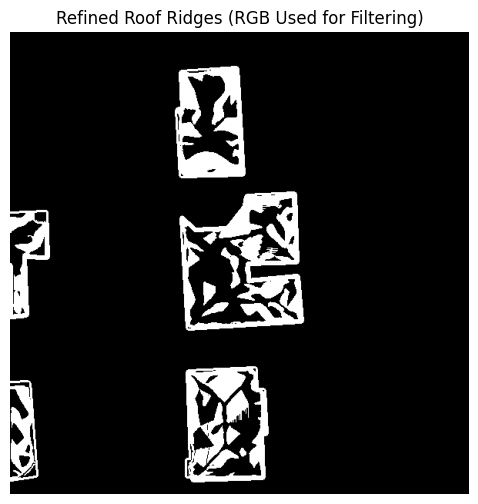

In [105]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from sklearn.linear_model import RANSACRegressor
from skimage.segmentation import slic, watershed
from skimage.filters import sobel
from skimage.color import rgb2gray
from skimage.morphology import remove_small_objects
from scipy.ndimage import gaussian_gradient_magnitude

# Load DSM TIFF
def load_dsm(dsm_path):
    dsm = Image.open(dsm_path)
    return np.array(dsm, dtype=np.float32)  

# Load and align RGB TIFF
def load_rgb(rgb_path, target_shape):
    rgb = Image.open(rgb_path)
    rgb = np.array(rgb)  

    # Ensure RGB is transposed & resized to match DSM shape
    if rgb.shape[:2] != target_shape:
        rgb = np.array(Image.fromarray(rgb).resize((target_shape[1], target_shape[0])))

    return rgb

# Convert DSM to 3D point cloud
def dsm_to_point_cloud(dsm):
    h, w = dsm.shape
    x, y = np.meshgrid(np.arange(w), np.arange(h))
    points = np.column_stack((x.ravel(), y.ravel(), dsm.ravel()))
    return points, h, w

# Adaptive RANSAC plane extraction
def fit_planes_ransac_dynamic(points, h, w, min_points=500, threshold=0.3):
    planes = []
    inlier_masks = []
    remaining_points = points.copy()

    while len(remaining_points) > min_points:
        model = RANSACRegressor(residual_threshold=threshold)
        model.fit(remaining_points[:, :2], remaining_points[:, 2])  

        inliers = model.inlier_mask_
        if np.sum(inliers) < min_points:
            break

        planes.append(model.estimator_.coef_)
        inlier_mask = np.zeros((h, w), dtype=bool)
        x_idx = np.clip(remaining_points[:, 0].astype(int), 0, w - 1)
        y_idx = np.clip(remaining_points[:, 1].astype(int), 0, h - 1)
        inlier_mask[y_idx, x_idx] = inliers
        inlier_masks.append(inlier_mask)

        remaining_points = remaining_points[~inliers]

    return planes, inlier_masks

# Extract ridges from DSM and refine using RGB
def extract_ridges_refined(dsm, rgb, inlier_masks):
    h, w = dsm.shape
    ridge_map = np.zeros((h, w), dtype=np.uint8)

    # Compute DSM ridge detection (without RGB fusion)
    grad_dsm = gaussian_gradient_magnitude(dsm, sigma=1)
    threshold = np.percentile(grad_dsm, 90)
    ridge_map[grad_dsm > threshold] = 255

    # Convert RGB to grayscale
    rgb_gray = rgb2gray(rgb)

    # Segment the RGB image to remove non-roof areas
    num_segments = max(h * w // 1000, 100)
    slic_segments = slic(rgb_gray, n_segments=num_segments, compactness=10, start_label=0,channel_axis=None)

    # Keep ridges only in roof regions
    ridge_mask = np.zeros((h, w), dtype=bool)
    for mask in inlier_masks:
        ridge_mask |= mask  

    filtered_ridges = ridge_map * ridge_mask

    # Remove small noise
    filtered_ridges = remove_small_objects(filtered_ridges.astype(bool), min_size=50).astype(np.uint8) * 255

    return filtered_ridges

# Load images
#dsm_path = "your_dsm.tif"
rgb_path = "25.9231767_-80.18102429999999_nearmap_rgb.tif"

dsm_masked = dsm_masked
rgb_aligned = load_rgb(rgb_path, dsm_masked.shape)

# Convert DSM to point cloud
points, h, w = dsm_to_point_cloud(dsm_masked)

# Fit planes using RANSAC
planes, inlier_masks = fit_planes_ransac_dynamic(points, h, w, min_points=500, threshold=0.3)

# Extract ridges with RGB used only for filtering
ridge_map = extract_ridges_refined(dsm_masked, rgb_aligned, inlier_masks)

# Visualize results
plt.figure(figsize=(8, 6))
plt.imshow(ridge_map, cmap='gray')
plt.title("Refined Roof Ridges (RGB Used for Filtering)")
plt.axis('off')
plt.show()


c:\Users\adity\miniconda3\envs\pytorch-gpu-env\lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 128640 (\N{ROCKET}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


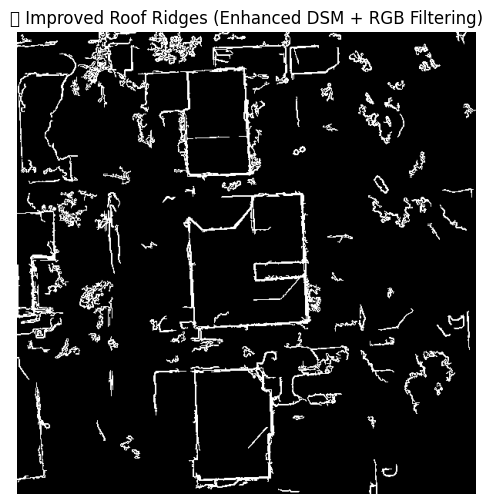

In [106]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from sklearn.linear_model import RANSACRegressor
from skimage.segmentation import slic, watershed
from skimage.filters import laplace, sobel
from skimage.color import rgb2gray
from skimage.morphology import remove_small_objects
from scipy.ndimage import gaussian_gradient_magnitude

# Load DSM TIFF
def load_dsm(dsm_path):
    dsm = Image.open(dsm_path)
    return np.array(dsm, dtype=np.float32)  

# Load and align RGB TIFF
def load_rgb(rgb_path, target_shape):
    rgb = Image.open(rgb_path)
    rgb = np.array(rgb)  

    # Ensure RGB is transposed & resized to match DSM shape
    if rgb.shape[:2] != target_shape:
        rgb = np.array(Image.fromarray(rgb).resize((target_shape[1], target_shape[0])))

    return rgb

# Convert DSM to 3D point cloud
def dsm_to_point_cloud(dsm):
    h, w = dsm.shape
    x, y = np.meshgrid(np.arange(w), np.arange(h))
    points = np.column_stack((x.ravel(), y.ravel(), dsm.ravel()))
    return points, h, w

# Adaptive RANSAC plane extraction
def fit_planes_ransac_dynamic(points, h, w, min_points=500, threshold=0.3):
    planes = []
    inlier_masks = []
    remaining_points = points.copy()

    while len(remaining_points) > min_points:
        model = RANSACRegressor(residual_threshold=threshold)
        model.fit(remaining_points[:, :2], remaining_points[:, 2])  

        inliers = model.inlier_mask_
        if np.sum(inliers) < min_points:
            break

        planes.append(model.estimator_.coef_)
        inlier_mask = np.zeros((h, w), dtype=bool)
        x_idx = np.clip(remaining_points[:, 0].astype(int), 0, w - 1)
        y_idx = np.clip(remaining_points[:, 1].astype(int), 0, h - 1)
        inlier_mask[y_idx, x_idx] = inliers
        inlier_masks.append(inlier_mask)

        remaining_points = remaining_points[~inliers]

    return planes, inlier_masks

# Advanced Ridge Detection with DSM + RGB Refinement
def extract_ridges_refined(dsm, rgb, inlier_masks):
    h, w = dsm.shape
    ridge_map = np.zeros((h, w), dtype=np.uint8)

    # 🔹 **Step 1: Enhance DSM Contrast for Better Edges**
    dsm_sharpened = dsm + 0.5 * laplace(dsm)  # Laplacian sharpening

    # 🔹 **Step 2: Detect Edges Separately in DSM & RGB**
    grad_dsm = gaussian_gradient_magnitude(dsm_sharpened, sigma=1)
    grad_rgb = sobel(rgb2gray(rgb))

    # Normalize for better fusion
    grad_dsm = (grad_dsm - grad_dsm.min()) / (grad_dsm.max() - grad_dsm.min())
    grad_rgb = (grad_rgb - grad_rgb.min()) / (grad_rgb.max() - grad_rgb.min())

    # 🔹 **Step 3: Fuse Edge Information for Inner Ridge Enhancement**
    fused_edges = grad_dsm * 0.7 + grad_rgb * 0.3  # Weighted fusion

    # 🔹 **Step 4: Adaptive Thresholding for Strong Ridges**
    threshold = np.percentile(fused_edges, 85)
    ridge_map[fused_edges > threshold] = 255

    # 🔹 **Step 5: Apply Superpixel Segmentation to Separate Roofs**
    num_segments = max(h * w // 800, 120)  
    slic_segments = slic(rgb, n_segments=num_segments, compactness=15, start_label=0)

    # Keep ridges only within valid roof areas
    ridge_mask = np.zeros((h, w), dtype=bool)
    for mask in inlier_masks:
        ridge_mask |= mask  

    filtered_ridges = ridge_map * ridge_mask

    # 🔹 **Step 6: Remove Small Noise & False Edges**
    filtered_ridges = remove_small_objects(filtered_ridges.astype(bool), min_size=50).astype(np.uint8) * 255

    return filtered_ridges

# Load images
#dsm_path = "your_dsm.tif"
rgb_path = "25.9231767_-80.18102429999999_nearmap_rgb.tif"

dsm_masked = dsm_masked
rgb_aligned = load_rgb(rgb_path, dsm_masked.shape)

# Convert DSM to point cloud
points, h, w = dsm_to_point_cloud(dsm_masked)

# Fit planes using RANSAC
planes, inlier_masks = fit_planes_ransac_dynamic(points, h, w, min_points=500, threshold=0.3)

# Extract ridges with RGB-assisted refinement
ridge_map = extract_ridges_refined(dsm_masked, rgb_aligned, inlier_masks)

# Visualize results
plt.figure(figsize=(8, 6))
plt.imshow(ridge_map, cmap='gray')
plt.title("🚀 Improved Roof Ridges (Enhanced DSM + RGB Filtering)")
plt.axis('off')
plt.show()


c:\Users\adity\miniconda3\envs\pytorch-gpu-env\lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 128640 (\N{ROCKET}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


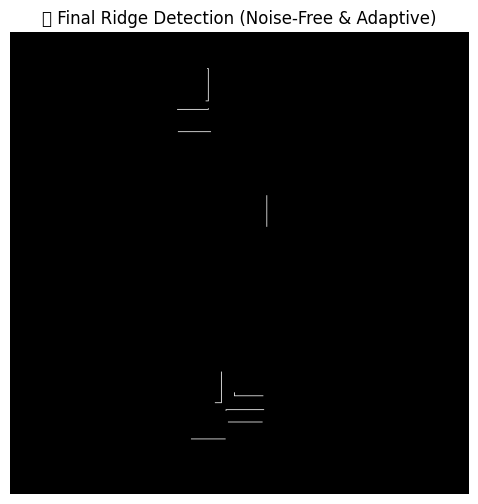

In [111]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from sklearn.linear_model import RANSACRegressor
from skimage.segmentation import slic
from skimage.filters import laplace, sobel
from skimage.morphology import remove_small_objects, thin
from skimage.color import rgb2gray
from scipy.ndimage import gaussian_filter

# Load DSM TIFF
def load_dsm(dsm_path):
    dsm = Image.open(dsm_path)
    return np.array(dsm, dtype=np.float32)  

# Load and align RGB TIFF
def load_rgb(rgb_path, target_shape):
    rgb = Image.open(rgb_path)
    rgb = np.array(rgb)  

    if rgb.shape[:2] != target_shape:
        rgb = np.array(Image.fromarray(rgb).resize((target_shape[1], target_shape[0])))

    return rgb

# Convert DSM to 3D point cloud
def dsm_to_point_cloud(dsm):
    h, w = dsm.shape
    x, y = np.meshgrid(np.arange(w), np.arange(h))
    points = np.column_stack((x.ravel(), y.ravel(), dsm.ravel()))
    return points, h, w

# Adaptive RANSAC plane extraction
def fit_planes_ransac_dynamic(points, h, w, min_points=500, threshold=0.3):
    planes = []
    inlier_masks = []
    remaining_points = points.copy()

    while len(remaining_points) > min_points:
        model = RANSACRegressor(residual_threshold=threshold)
        model.fit(remaining_points[:, :2], remaining_points[:, 2])  

        inliers = model.inlier_mask_
        if np.sum(inliers) < min_points:
            break

        planes.append(model.estimator_.coef_)
        inlier_mask = np.zeros((h, w), dtype=bool)
        x_idx = np.clip(remaining_points[:, 0].astype(int), 0, w - 1)
        y_idx = np.clip(remaining_points[:, 1].astype(int), 0, h - 1)
        inlier_mask[y_idx, x_idx] = inliers
        inlier_masks.append(inlier_mask)

        remaining_points = remaining_points[~inliers]

    return planes, inlier_masks

# **New Ridge Extraction Method**
def extract_ridges_adaptive(dsm, inlier_masks):
    h, w = dsm.shape
    ridge_map = np.zeros((h, w), dtype=np.uint8)

    # 🔹 **Step 1: Remove DSM Noise for Better Ridge Detection**
    dsm_smooth = gaussian_filter(dsm, sigma=1)  # Reduce terrain noise
    dsm_sharp = dsm_smooth + 0.5 * laplace(dsm_smooth)  # Enhance structural changes

    # 🔹 **Step 2: Extract Structural Edges from DSM**
    grad_dsm = sobel(dsm_sharp)

    # Normalize gradients for better ridge detection
    grad_dsm = (grad_dsm - grad_dsm.min()) / (grad_dsm.max() - grad_dsm.min())

    # 🔹 **Step 3: Adaptive Thresholding Based on Local Stats**
    threshold = np.percentile(grad_dsm, 10)  # Dynamically set threshold
    ridge_map[grad_dsm > threshold] = 255  # Keep only strong ridges

    # 🔹 **Step 4: Ensure Ridges Stay Inside Roofs**
    ridge_mask = np.zeros((h, w), dtype=bool)
    for mask in inlier_masks:
        ridge_mask |= mask  

    filtered_ridges = ridge_map * ridge_mask  # Remove noise outside roofs

    # 🔹 **Step 5: Thin and Remove Artifacts**
    filtered_ridges = thin(filtered_ridges > 0).astype(np.uint8) * 255  # Thin ridge lines
    filtered_ridges = remove_small_objects(filtered_ridges.astype(bool), min_size=40).astype(np.uint8) * 255  # Remove small false detections

    return filtered_ridges

# Load images
#dsm_path = "your_dsm.tif"
rgb_path = "25.9231767_-80.18102429999999_nearmap_rgb.tif"

dsm_masked = dsm_masked
rgb_aligned = load_rgb(rgb_path, dsm_masked.shape)

# Convert DSM to point cloud
points, h, w = dsm_to_point_cloud(dsm_masked)

# Fit planes using RANSAC
planes, inlier_masks = fit_planes_ransac_dynamic(points, h, w, min_points=500, threshold=0.3)

# Extract refined ridges
ridge_map = extract_ridges_adaptive(dsm_masked, inlier_masks)

# Visualize results
plt.figure(figsize=(8, 6))
plt.imshow(ridge_map, cmap='gray')
plt.title("🚀 Final Ridge Detection (Noise-Free & Adaptive)")
plt.axis('off')
plt.show()


c:\Users\adity\miniconda3\envs\pytorch-gpu-env\lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 128640 (\N{ROCKET}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


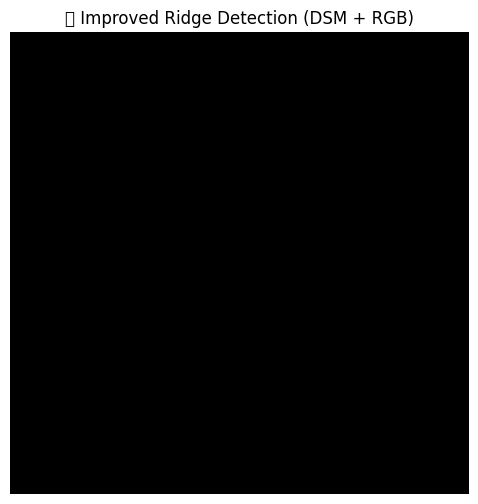

In [113]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from skimage.filters import sobel
from skimage.feature import canny
from skimage.morphology import remove_small_objects, thin
from skimage.util import img_as_ubyte
from skimage.color import rgb2gray
from scipy.ndimage import gaussian_filter

# **Load DSM & RGB**
def load_tiff(path):
    img = Image.open(path)
    return np.array(img, dtype=np.float32)

def load_rgb(path, target_size):
    img = Image.open(path)
    img = img.resize(target_size, Image.Resampling.BILINEAR)  # Resize RGB to match DSM
    return np.array(img, dtype=np.uint8)

# **Convert DSM to Features**
def preprocess_dsm(dsm):
    dsm = gaussian_filter(dsm, sigma=1)  # Smooth terrain
    dsm_edges = sobel(dsm)  # Height-based edges
    return dsm_edges

# **Extract Texture-Based Ridges from RGB**
def preprocess_rgb(rgb):
    gray = rgb2gray(rgb) if len(rgb.shape) == 3 else rgb
    rgb_edges = canny(gray, sigma=1)  # Extract fine texture edges
    return rgb_edges

# **Combine Both Features for Final Ridge Map**
def extract_ridges(dsm, rgb):
    h, w = dsm.shape
    ridge_map = np.zeros((h, w), dtype=np.uint8)

    # **Step 1: Extract DSM & RGB Features**
    dsm_edges = preprocess_dsm(dsm)
    rgb_edges = preprocess_rgb(rgb)

    # **Step 2: Fuse Both**
    combined = np.maximum(dsm_edges, rgb_edges)  # Merging DSM & RGB edges

    # **Step 3: Threshold Adaptively**
    threshold = np.percentile(combined, 70)
    ridge_map[combined > threshold] = 255

    # **Step 4: Post-process Ridges**
    ridges = thin(ridge_map > 0).astype(np.uint8) * 255  # Thinning
    ridges = remove_small_objects(ridges.astype(bool), min_size=50).astype(np.uint8) * 255  # Remove clutter

    return ridges

# **Load Images**
#dsm_path = "your_dsm.tif"
rgb_path = "25.9231767_-80.18102429999999_nearmap_rgb.tif"

dsm = dsm_masked
rgb = load_rgb(rgb_path, target_size=(dsm.shape[1], dsm.shape[0]))  # Match DSM size

# **Extract Ridges**
ridge_map = extract_ridges(dsm, rgb)

# **Final Visualization**
plt.figure(figsize=(8, 6))
plt.imshow(ridge_map, cmap='gray')
plt.title("🚀 Improved Ridge Detection (DSM + RGB)")
plt.axis('off')
plt.show()


c:\Users\adity\miniconda3\envs\pytorch-gpu-env\lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 128640 (\N{ROCKET}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


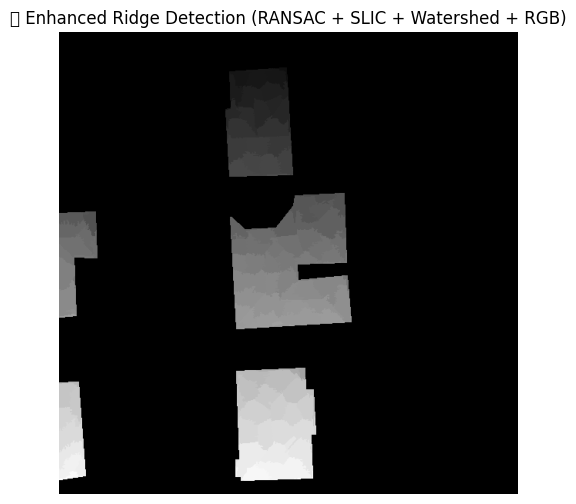

In [114]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from skimage.segmentation import slic, watershed
from skimage.filters import sobel
from skimage.util import img_as_ubyte
from skimage.color import rgb2gray
from sklearn.linear_model import RANSACRegressor

# **Load DSM & RGB**
def load_tiff(path):
    img = Image.open(path)
    return np.array(img, dtype=np.float32)

def load_rgb(path, target_size):
    img = Image.open(path)
    img = img.resize(target_size, Image.Resampling.BILINEAR)  # Match DSM size
    return np.array(img, dtype=np.uint8)

# **Convert DSM to Point Cloud**
def dsm_to_point_cloud(dsm):
    h, w = dsm.shape
    x, y = np.meshgrid(np.arange(w), np.arange(h))
    points = np.column_stack((x.ravel(), y.ravel(), dsm.ravel()))
    return points, h, w

# **Adaptive RANSAC Plane Extraction**
def fit_planes_ransac(points, h, w, min_points=500, threshold=0.3):
    planes = []
    inlier_masks = []
    remaining_points = points.copy()

    while len(remaining_points) > min_points:
        model = RANSACRegressor(residual_threshold=threshold)
        model.fit(remaining_points[:, :2], remaining_points[:, 2])  

        inliers = model.inlier_mask_
        if np.sum(inliers) < min_points:
            break

        planes.append(model.estimator_.coef_)
        inlier_mask = np.zeros((h, w), dtype=bool)
        x_idx = np.clip(remaining_points[:, 0].astype(int), 0, w - 1)
        y_idx = np.clip(remaining_points[:, 1].astype(int), 0, h - 1)
        inlier_mask[y_idx, x_idx] = inliers
        inlier_masks.append(inlier_mask)

        remaining_points = remaining_points[~inliers]

    return planes, inlier_masks

# **Ridge Extraction with SLIC + Watershed**
def extract_ridges(dsm, rgb, inlier_masks):
    h, w = dsm.shape
    ridge_map = np.zeros((h, w), dtype=np.uint8)

    # **Step 1: Compute DSM Gradient**
    dsm_edges = sobel(dsm)  # Height-based edge detection

    # **Step 2: SLIC Segmentation (Using RGB)**
    num_segments = max(h * w // 500, 150)
    slic_segments = slic(rgb, n_segments=num_segments, compactness=10, start_label=0)

    # **Step 3: Watershed Using SLIC**
    markers = slic_segments + 1
    watershed_segmentation = watershed(-dsm_edges, markers, mask=dsm_edges > 0)

    return watershed_segmentation

# **Load Data**
#dsm_path = "your_dsm.tif"
rgb_path = "25.9231767_-80.18102429999999_nearmap_rgb.tif"

dsm = dsm_masked
rgb = load_rgb(rgb_path, target_size=(dsm.shape[1], dsm.shape[0]))  # Match DSM size

# **RANSAC on DSM**
points, h, w = dsm_to_point_cloud(dsm)
planes, inlier_masks = fit_planes_ransac(points, h, w, min_points=500, threshold=0.3)

# **Extract Ridges Using RGB & DSM**
ridge_map = extract_ridges(dsm, rgb, inlier_masks)

# **Visualize**
plt.figure(figsize=(8, 6))
plt.imshow(ridge_map, cmap='gray')
plt.title("🚀 Enhanced Ridge Detection (RANSAC + SLIC + Watershed + RGB)")
plt.axis('off')
plt.show()


c:\Users\adity\miniconda3\envs\pytorch-gpu-env\lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 128640 (\N{ROCKET}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


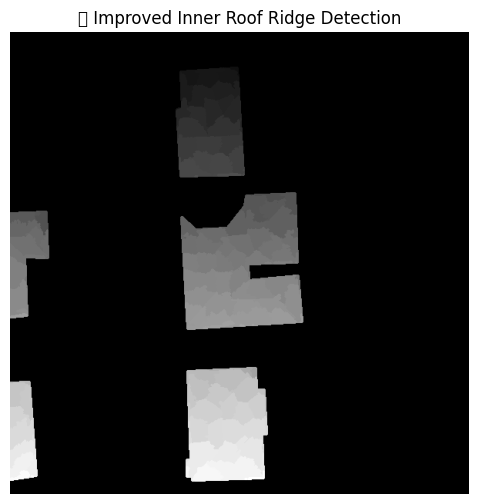

In [115]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from skimage.segmentation import slic, watershed
from skimage.filters import sobel
from skimage.util import img_as_ubyte
from skimage.color import rgb2gray
from skimage.feature import canny
from skimage.morphology import dilation, disk
from skimage.restoration import denoise_tv_chambolle
from sklearn.linear_model import RANSACRegressor

# **Load DSM & RGB**
def load_tiff(path):
    img = Image.open(path)
    return np.array(img, dtype=np.float32)

def load_rgb(path, target_size):
    img = Image.open(path)
    img = img.resize(target_size, Image.Resampling.BILINEAR)  # Match DSM size
    return np.array(img, dtype=np.uint8)

# **Convert DSM to Point Cloud**
def dsm_to_point_cloud(dsm):
    h, w = dsm.shape
    x, y = np.meshgrid(np.arange(w), np.arange(h))
    points = np.column_stack((x.ravel(), y.ravel(), dsm.ravel()))
    return points, h, w

# **Adaptive RANSAC Plane Extraction**
def fit_planes_ransac(points, h, w, min_points=500, threshold=0.3):
    planes = []
    inlier_masks = []
    remaining_points = points.copy()

    while len(remaining_points) > min_points:
        model = RANSACRegressor(residual_threshold=threshold)
        model.fit(remaining_points[:, :2], remaining_points[:, 2])  

        inliers = model.inlier_mask_
        if np.sum(inliers) < min_points:
            break

        planes.append(model.estimator_.coef_)
        inlier_mask = np.zeros((h, w), dtype=bool)
        x_idx = np.clip(remaining_points[:, 0].astype(int), 0, w - 1)
        y_idx = np.clip(remaining_points[:, 1].astype(int), 0, h - 1)
        inlier_mask[y_idx, x_idx] = inliers
        inlier_masks.append(inlier_mask)

        remaining_points = remaining_points[~inliers]

    return planes, inlier_masks

# **Enhanced Ridge Extraction Using RGB & DSM**
def extract_ridges(dsm, rgb, inlier_masks):
    h, w = dsm.shape
    ridge_map = np.zeros((h, w), dtype=np.uint8)

    # **Step 1: Compute Multi-scale DSM Gradients**
    dsm_edges = sobel(dsm)  # Height-based edge detection
    canny_edges = canny(dsm, sigma=1.2)  # Canny for sharper edges
    edge_combined = np.maximum(dsm_edges, canny_edges)  # Merge edge maps

    # **Step 2: SLIC Superpixel Segmentation with Edge-Aware Refinement**
    num_segments = max(h * w // 500, 150)
    slic_segments = slic(rgb, n_segments=num_segments, compactness=10, start_label=0)
    
    # **Step 3: Merge Edge Data into SLIC Superpixels**
    slic_edges = np.zeros_like(slic_segments)
    slic_edges[edge_combined > np.percentile(edge_combined, 80)] = 255  # Edge filtering

    # **Step 4: Apply Watershed on Combined DSM + RGB**
    markers = slic_segments + 1
    watershed_segmentation = watershed(-edge_combined, markers, mask=edge_combined > 0)

    # **Step 5: Apply Morphological Refinement**
    ridge_map = dilation(watershed_segmentation, disk(1))  # Enhancing fine edges

    return ridge_map

# **Load Data**
#dsm_path = "your_dsm.tif"
rgb_path = "25.9231767_-80.18102429999999_nearmap_rgb.tif"

dsm = dsm_masked
rgb = load_rgb(rgb_path, target_size=(dsm.shape[1], dsm.shape[0]))  # Match DSM size

# **RANSAC on DSM**
points, h, w = dsm_to_point_cloud(dsm)
planes, inlier_masks = fit_planes_ransac(points, h, w, min_points=500, threshold=0.3)

# **Extract Ridges Using RGB & DSM**
ridge_map = extract_ridges(dsm, rgb, inlier_masks)

# **Visualize**
plt.figure(figsize=(8, 6))
plt.imshow(ridge_map, cmap='gray')
plt.title("🚀 Improved Inner Roof Ridge Detection")
plt.axis('off')
plt.show()


In [119]:
cv2.imwrite('dsm_masked.jpg',dsm_masked)

True

c:\Users\adity\miniconda3\envs\pytorch-gpu-env\lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 128640 (\N{ROCKET}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


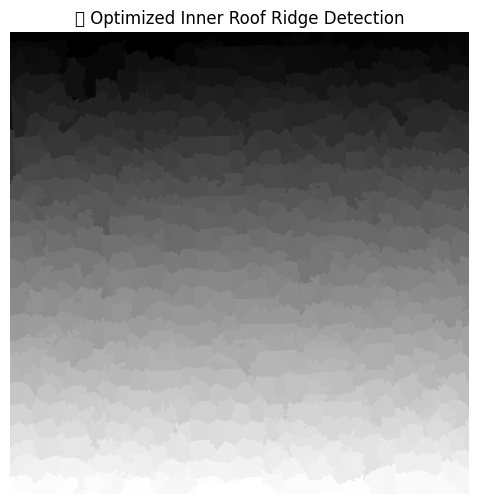

In [122]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from skimage.segmentation import slic, watershed
from skimage.filters import sobel, laplace, hessian
from skimage.util import img_as_ubyte
from skimage.color import rgb2gray
from skimage.feature import canny
from skimage.morphology import dilation, disk
from sklearn.linear_model import RANSACRegressor

# **Load DSM & RGB**
def load_tiff(path):
    img = Image.open(path)
    return np.array(img, dtype=np.float32)

def load_rgb(path, target_size):
    img = Image.open(path)
    img = img.resize(target_size, Image.Resampling.BILINEAR)  # Match DSM size
    return np.array(img, dtype=np.uint8)

# **Convert DSM to Point Cloud**
def dsm_to_point_cloud(dsm):
    h, w = dsm.shape
    x, y = np.meshgrid(np.arange(w), np.arange(h))
    points = np.column_stack((x.ravel(), y.ravel(), dsm.ravel()))
    return points, h, w

# **Adaptive RANSAC Plane Extraction**
def fit_planes_ransac(points, h, w, min_points=500, threshold=0.25):
    planes = []
    inlier_masks = []
    remaining_points = points.copy()

    while len(remaining_points) > min_points:
        model = RANSACRegressor(residual_threshold=threshold)
        model.fit(remaining_points[:, :2], remaining_points[:, 2])  

        inliers = model.inlier_mask_
        if np.sum(inliers) < min_points:
            break

        planes.append(model.estimator_.coef_)
        inlier_mask = np.zeros((h, w), dtype=bool)
        x_idx = np.clip(remaining_points[:, 0].astype(int), 0, w - 1)
        y_idx = np.clip(remaining_points[:, 1].astype(int), 0, h - 1)
        inlier_mask[y_idx, x_idx] = inliers
        inlier_masks.append(inlier_mask)

        remaining_points = remaining_points[~inliers]

    return planes, inlier_masks

# **Enhanced Ridge Extraction Using RGB & DSM**
def extract_ridges(dsm, rgb, inlier_masks):
    h, w = dsm.shape
    ridge_map = np.zeros((h, w), dtype=np.uint8)

    # **Step 1: Compute Multi-scale DSM Height Variations**
    dsm_diff = np.abs(dsm - np.median(dsm))  # Local height differences
    sobel_dsm = sobel(dsm_diff)  # Height edge detection
    laplacian_dsm = laplace(dsm_diff)  # Enhancing fine structures

    dsm_edge_map = np.maximum(sobel_dsm, laplacian_dsm)  # Merge height features

    # **Step 2: Use RGB Grayscale Edge Detection**
    gray_rgb = rgb2gray(rgb)
    canny_rgb = canny(gray_rgb, sigma=1.5)  # Detect sharp edges
    hessian_rgb = hessian(gray_rgb)  # Capture subtle roof structures

    rgb_edge_map = np.maximum(canny_rgb, hessian_rgb)

    # **Step 3: Fuse RGB & DSM Features**
    fused_edges = np.maximum(dsm_edge_map, rgb_edge_map)

    # **Step 4: Improved SLIC Superpixel Segmentation**
    num_segments = max(h * w // 500, 200)
    slic_segments = slic(rgb, n_segments=num_segments, compactness=15, start_label=0)

    # **Step 5: Apply Watershed with Strong Constraints**
    markers = slic_segments + 1
    watershed_segmentation = watershed(-fused_edges, markers, mask=fused_edges > 0)

    # **Step 6: Morphological Refinement**
    ridge_map = dilation(watershed_segmentation, disk(1))

    return ridge_map

# **Load Data**
#dsm_path = "your_dsm.tif"
rgb_path = "25.9231767_-80.18102429999999_nearmap_rgb.tif"

dsm = dsm_masked
rgb = load_rgb(rgb_path, target_size=(dsm.shape[1], dsm.shape[0]))  # Match DSM size

# **RANSAC on DSM**
points, h, w = dsm_to_point_cloud(dsm)
planes, inlier_masks = fit_planes_ransac(points, h, w, min_points=500, threshold=0.25)

# **Extract Ridges Using RGB & DSM**
ridge_map = extract_ridges(dsm, rgb, inlier_masks)

# **Visualize**
plt.figure(figsize=(8, 6))
plt.imshow(ridge_map, cmap='gray')
plt.title("🚀 Optimized Inner Roof Ridge Detection")
plt.axis('off')
plt.show()


c:\Users\adity\miniconda3\envs\pytorch-gpu-env\lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 128640 (\N{ROCKET}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


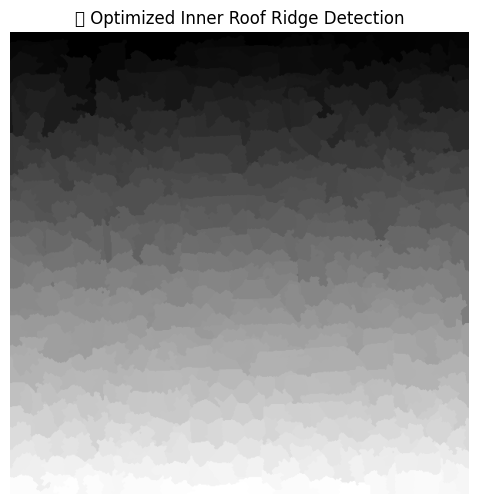

In [123]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from skimage.segmentation import slic, watershed
from skimage.filters import sobel, laplace, hessian
from skimage.util import img_as_ubyte
from skimage.color import rgb2gray
from skimage.feature import canny
from skimage.morphology import dilation, erosion, disk
from sklearn.linear_model import RANSACRegressor

# **Load DSM & RGB**
def load_tiff(path):
    img = Image.open(path)
    return np.array(img, dtype=np.float32)

def load_rgb(path, target_size):
    img = Image.open(path)
    img = img.resize(target_size, Image.Resampling.BILINEAR)  # Match DSM size
    return np.array(img, dtype=np.uint8)

# **Convert DSM to Point Cloud**
def dsm_to_point_cloud(dsm):
    h, w = dsm.shape
    x, y = np.meshgrid(np.arange(w), np.arange(h))
    points = np.column_stack((x.ravel(), y.ravel(), dsm.ravel()))
    return points, h, w

# **Adaptive RANSAC Plane Extraction**
def fit_planes_ransac(points, h, w, min_points=500, threshold=0.3):
    planes = []
    inlier_masks = []
    remaining_points = points.copy()

    while len(remaining_points) > min_points:
        model = RANSACRegressor(residual_threshold=threshold)
        model.fit(remaining_points[:, :2], remaining_points[:, 2])  

        inliers = model.inlier_mask_
        if np.sum(inliers) < min_points:
            break

        planes.append(model.estimator_.coef_)
        inlier_mask = np.zeros((h, w), dtype=bool)
        x_idx = np.clip(remaining_points[:, 0].astype(int), 0, w - 1)
        y_idx = np.clip(remaining_points[:, 1].astype(int), 0, h - 1)
        inlier_mask[y_idx, x_idx] = inliers
        inlier_masks.append(inlier_mask)

        remaining_points = remaining_points[~inliers]

    return planes, inlier_masks

# **Optimized Ridge Extraction with RGB & DSM**
def extract_ridges(dsm, rgb, inlier_masks):
    h, w = dsm.shape
    ridge_map = np.zeros((h, w), dtype=np.uint8)

    # **Step 1: Normalize DSM & Compute Local Height Variations**
    dsm = (dsm - np.min(dsm)) / (np.max(dsm) - np.min(dsm) + 1e-6)  # Normalize
    dsm_diff = np.abs(dsm - np.median(dsm))  # Local height differences
    sobel_dsm = sobel(dsm_diff)  # Height edges
    laplacian_dsm = laplace(dsm_diff)  # Fine structures

    dsm_edge_map = 0.7 * sobel_dsm + 0.3 * laplacian_dsm  # Weighted fusion

    # **Step 2: Convert RGB to Grayscale & Extract Texture Edges**
    gray_rgb = rgb2gray(rgb)
    canny_rgb = canny(gray_rgb, sigma=1.0)  # Sharp edges
    hessian_rgb = hessian(gray_rgb)  # Roof structures

    rgb_edge_map = 0.6 * canny_rgb + 0.4 * hessian_rgb  # Weighted fusion

    # **Step 3: Combine DSM & RGB Features**
    fused_edges = np.maximum(dsm_edge_map, rgb_edge_map)

    # **Step 4: Improved SLIC Superpixel Segmentation**
    num_segments = max(h * w // 500, 200)
    slic_segments = slic(rgb, n_segments=num_segments, compactness=12, start_label=0)

    # **Step 5: Apply Watershed with Proper Constraints**
    markers = slic_segments + 1
    watershed_segmentation = watershed(-fused_edges, markers, mask=fused_edges > 0)

    # **Step 6: Morphological Refinement**
    ridge_map = dilation(watershed_segmentation, disk(2))
    ridge_map = erosion(ridge_map, disk(1))  # Remove small noise

    return ridge_map

# **Load Data**
#dsm_path = "your_dsm.tif"
rgb_path = "25.9231767_-80.18102429999999_nearmap_rgb.tif"

dsm = dsm_masked
rgb = load_rgb(rgb_path, target_size=(dsm.shape[1], dsm.shape[0]))  # Match DSM size

# **RANSAC on DSM**
points, h, w = dsm_to_point_cloud(dsm)
planes, inlier_masks = fit_planes_ransac(points, h, w, min_points=500, threshold=0.3)

# **Extract Ridges Using RGB & DSM**
ridge_map = extract_ridges(dsm, rgb, inlier_masks)

# **Visualize**
plt.figure(figsize=(8, 6))
plt.imshow(ridge_map, cmap='gray')
plt.title("🚀 Optimized Inner Roof Ridge Detection")
plt.axis('off')
plt.show()


Now moving on to understand the feature map generation on the encoder side which is a EffecientNet the top2-3 blocks which correspond to the CNN and filter generation to the lower end of the pyramid.

In [ ]:
import torch
import torch.nn as nn
import rasterio
import numpy as np
import matplotlib.pyplot as plt
import os
from torchvision import models
from torchvision.transforms import functional as F

# === TIFF Processing Class ===
class TIFFProcessor:
    def __init__(self, directory=None, normalize=True):
        self.directory = directory
        self.normalize = normalize

    def load_tiff_as_tensor(self, tiff_path):
        """Load TIFF file as PyTorch tensor."""
        with rasterio.open(tiff_path) as src:
            image = src.read()  # (C, H, W)

        image_tensor = torch.tensor(image, dtype=torch.float32)

        # Normalize if needed
        if self.normalize and image_tensor.max() > 1:
            image_tensor /= image_tensor.max()

        # Convert to 3-channel if single-band
        if image_tensor.shape[0] == 1:
            image_tensor = image_tensor.repeat(3, 1, 1)  # Convert grayscale to RGB

        # Add batch dimension (1, C, H, W)
        image_tensor = image_tensor.unsqueeze(0)

        return image_tensor

    def visualize_tiff(self, tensor):
        """Visualize TIFF tensor as an image."""
        image = tensor.squeeze(0).numpy()

        # If more than 3 bands, take first 3
        if image.shape[0] > 3:
            image = image[:3, :, :]

        image = np.transpose(image, (1, 2, 0))  # (C, H, W) → (H, W, C)

        plt.figure(figsize=(6, 6))
        plt.imshow(image)
        plt.axis("off")
        plt.title("TIFF Image Visualization")
        plt.show()


# === EfficientNet as Encoder ===
class EfficientNetEncoder(nn.Module):
    def __init__(self):
        super(EfficientNetEncoder, self).__init__()
        # Load Pretrained EfficientNet
        base_model = models.efficientnet_b0(pretrained=True)

        # Remove classifier head (keep feature extractor)
        self.encoder = nn.Sequential(*list(base_model.children())[:-2])

    def forward(self, x):
        return self.encoder(x)


# === Run Pipeline ===
if __name__ == "__main__":
    # Load TIFF
    processor = TIFFProcessor()
    tiff_path = "your_image.tif"  # Replace with your TIFF path
    image_tensor = processor.load_tiff_as_tensor(tiff_path)
    print(f"TIFF Shape: {image_tensor.shape}")  # Should be (1, 3, 600, 597)

    # Initialize Model
    model = EfficientNetEncoder()
    model.eval()  # Set to evaluation mode

    # Pass TIFF through the model
    with torch.no_grad():
        features = model(image_tensor)

    print(f"Feature Map Shape: {features.shape}")  # Example: (1, 1280, H/32, W/32)

    # Visualize Feature Maps
    feature_map = features.squeeze(0).cpu().numpy()
    num_features = feature_map.shape[0]

    fig, axs = plt.subplots(4, 4, figsize=(10, 10))  # Show 16 feature maps
    for i in range(16):
        ax = axs[i // 4, i % 4]
        ax.imshow(feature_map[i], cmap="gray")
        ax.axis("off")

    plt.suptitle("EfficientNet Feature Maps")
    plt.show()
